# Montney: Results (max_iter=10)

In [1]:
# import libraries
import numpy as np
import pandas as pd
import json

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import missingno as msno

from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

## 1. Data Pre-processing

In [2]:
# montney dataset
montney = pd.read_csv(filepath_or_buffer='dataset_montney.csv', low_memory=False)
montney.head()

,WELL_ID,DISPLAY_NAME,YEAR,X,Y,DEPTH,DENSITY,GR,SONIC,RESISTIVITY,SP,POROSITY,CALIPER,BITSIZE,TOC_CORE,TOC_CUTTINGS,LITHO,ORDER_3,ORDER_4
0,100031508122W500,0/03-15-081-22W5,2001,477579.55677,6.207776e+06,825.620,2.477900,81.453,255.236,4.782,-20.340,21.909,164.721,NaN,NaN,NaN,MONTNEY FM,Sequence 2,LST2
1,100031508122W500,0/03-15-081-22W5,2001,477579.55677,6.207776e+06,825.745,2.496034,85.738,255.687,4.793,-18.998,21.502,165.051,NaN,NaN,NaN,MONTNEY FM,Sequence 1,TST1
2,100031508122W500,0/03-15-081-22W5,2001,477579.55677,6.207776e+06,825.870,2.522904,93.034,258.596,4.499,-15.166,21.561,164.248,NaN,NaN,NaN,MONTNEY FM,Sequence 1,TST1
3,100031508122W500,0/03-15-081-22W5,2001,477579.55677,6.207776e+06,825.995,2.548484,102.140,264.808,4.126,-8.029,22.043,163.497,NaN,NaN,NaN,MONTNEY FM,Sequence 1,TST1
4,100031508122W500,0/03-15-081-22W5,2001,477579.55677,6.207776e+06,826.120,2.566674,111.973,273.186,3.567,-0.953,23.000,165.123,NaN,NaN,NaN,MONTNEY FM,Sequence 1,TST1


In [3]:
# rename columns
montney.rename(columns={'DENSITY': 'RHOB', 
                        'SONIC': 'DT',
                        'RESISTIVITY': 'RES', 
                        'POROSITY': 'NPHI',
                        'ORDER_4': 'STRAT'
                       }, inplace=True
              )


In [4]:
# drop unnecessary columns
montney.drop(['DISPLAY_NAME', 'CALIPER', 'BITSIZE', 'TOC_CUTTINGS', 'ORDER_3'], axis=1, inplace=True)

In [5]:
# handle outliers and well-log transformation

# replace sonic values smaller than 0 for NaN values
mask = montney['DT'] < 0
montney.loc[mask, 'DT'] = np.nan

# replace resistivity values smaller than or equal to 0 for NaN values
mask = montney['RES'] <= 0
montney.loc[mask, 'RES'] = np.nan

# create a new column to store log base 10 of resistivity
montney['RES_10'] = np.log10(montney['RES']+1)

# replace neutron porosity values smaller than 0 for NaN values
mask = montney['NPHI'] < 0
montney.loc[mask, 'NPHI'] = np.nan

# convert percentage to fraction
def convert_neutron(x):
    return x / 100

montney['NPHI'] = montney['NPHI'].apply(convert_neutron)

In [6]:
well_logs = ['RHOB', 'GR', 'DT', 'RES_10', 'SP', 'NPHI']

In [7]:
# label encoding for well id
well_encoder = LabelEncoder()
montney['WELL'] = well_encoder.fit_transform(montney['WELL_ID'])


In [8]:
# columns
montney.columns

Index(['WELL_ID', 'YEAR', 'X', 'Y', 'DEPTH', 'RHOB', 'GR', 'DT', 'RES', 'SP',
       'NPHI', 'TOC_CORE', 'LITHO', 'STRAT', 'RES_10', 'WELL'],
      dtype='object')

In [9]:
# feature selection
selected_features = ['WELL', 'X', 'Y', 'DEPTH', 
                     'RHOB', 'GR', 'DT', 'RES_10', 'SP', 'NPHI',
                     'LITHO', 'STRAT']

## 2. Data Splitting

In [10]:
# copy of the dataset for modeling
data_ml = montney[selected_features].copy()

In [11]:
# well test selection
test_wells = well_encoder.transform(['100042408423W600', '100041606522W500', '100071406522W500', 
                                     '100111408125W500', '100143207308W600', '100162407706W600'])

# mask for test well
test_mask = data_ml['WELL'].isin(test_wells)

# column to identify train and test wells
data_ml['train_test'] = 'Train'
data_ml.loc[test_mask, 'train_test'] = 'Test'

# fraction of data
train_fraction = data_ml[data_ml['train_test'] == 'Train'].shape[0] / data_ml.shape[0]
test_fraction = data_ml[data_ml['train_test'] == 'Test'].shape[0] / data_ml.shape[0]
print(f"Fraction of data in train set: {train_fraction:.2f}")
print(f"Fraction of data in test set: {test_fraction:.2f}")
print(f"Total number of samples in dataset: {data_ml.shape[0]}")

Fraction of data in train set: 0.85
Fraction of data in test set: 0.15
Total number of samples in dataset: 122374


In [12]:
# create train and test sets
train = data_ml[~test_mask].copy()
test = data_ml[test_mask].copy()

## 3. Results

In [13]:
well_logs = ['RHOB', 'GR', 'DT', 'RES_10', 'SP', 'NPHI']

### Training: Cross-Validation

In [14]:
# knr
with open('train_results_knr.txt', 'r') as f:
    train_results_knr = json.load(f)

# br
with open('train_results_br.txt', 'r') as f:
    train_results_br = json.load(f)

# rf
with open('train_results_rf.txt', 'r') as f:
    train_results_rf = json.load(f)
    
# xgb
with open('train_results_xgb.txt', 'r') as f:
    train_results_xgb = json.load(f)


In [15]:
def compare_well_logs(results, well_logs):
    metrics = list(results.keys())  
    data = []
    
    for i, metric in enumerate(metrics):
        average_values = [np.mean(results[metric][log]) for log in well_logs]
        data.append(average_values)
    
    df = pd.DataFrame(data, index=metrics, columns=well_logs)
    display(df)
    return df

train_knr = compare_well_logs(results=train_results_knr, well_logs=well_logs)
train_br = compare_well_logs(results=train_results_br, well_logs=well_logs)
train_rf = compare_well_logs(results=train_results_rf, well_logs=well_logs)
train_xgb = compare_well_logs(results=train_results_xgb, well_logs=well_logs)


,RHOB,GR,DT,RES_10,SP,NPHI
R2,-1.013674,-0.750133,-2.497974,-4.874023,-107.266007,-1.665735
MAE,0.057416,0.035975,0.073323,0.102550,0.423373,0.073470
MSE,0.005862,0.002949,0.012198,0.019406,0.596124,0.008856


,RHOB,GR,DT,RES_10,SP,NPHI
R2,-0.581651,-4.481393,-2.524761,-19.087308,-851.647237,-1.081006
MAE,0.053706,0.061051,0.076879,0.142563,0.504274,0.085585
MSE,0.005649,0.006243,0.012504,0.040315,0.577463,0.017113


,RHOB,GR,DT,RES_10,SP,NPHI
R2,-0.890813,-2.041296,-1.485372,-6.200326,-80.042690,-0.593831
MAE,0.055975,0.038813,0.064976,0.106147,0.387215,0.066013
MSE,0.005587,0.004174,0.009596,0.022093,0.531519,0.008682


,RHOB,GR,DT,RES_10,SP,NPHI
R2,-0.933098,-2.446106,-1.818931,-2.698321,-98.710760,-0.483054
MAE,0.056866,0.038709,0.064052,0.093469,0.418921,0.065874
MSE,0.005567,0.004863,0.010062,0.016864,0.582629,0.008521


In [16]:
train_results = {'KNR': train_knr,
                 'BR': train_br,
                 'RF': train_rf,
                 'XGB': train_xgb
                }

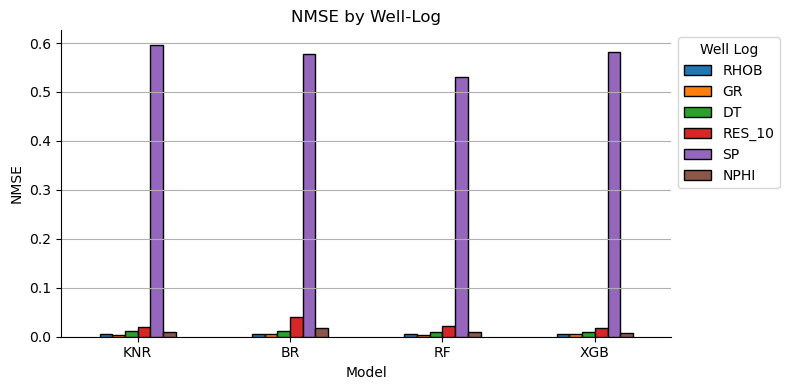

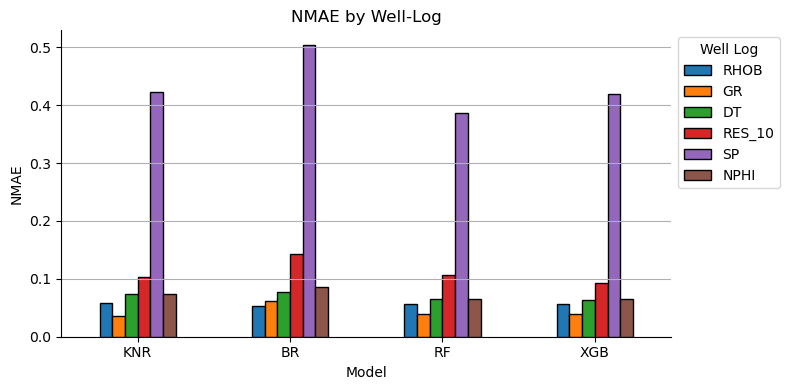

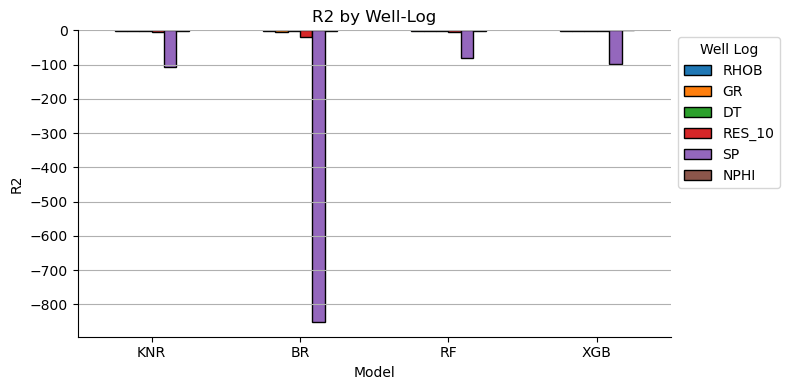

In [17]:
# NMSE - normalized mean squared error

metric = 'MSE'

model_data = []

for model_name, model_df in train_results.items():
    metric_values = model_df.loc[metric]
    model_data.append(metric_values)

df = pd.DataFrame(model_data, index=train_results.keys(), columns=well_logs)

ax = df.plot(kind='bar', figsize=(8, 4), edgecolor='black')

plt.title(f'N{metric} by Well-Log')
plt.xlabel('Model')
plt.ylabel('NMSE')

plt.xticks(rotation='horizontal')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.grid(True)
ax.legend(title='Well Log', bbox_to_anchor=(1, 1))

# ax.set_ylim([0, 0.1])

plt.tight_layout() 
plt.show()


# NMAE - normalized absolute error

metric = 'MAE'

model_data = []

for model_name, model_df in train_results.items():
    metric_values = model_df.loc[metric]
    model_data.append(metric_values)

df = pd.DataFrame(model_data, index=train_results.keys(), columns=well_logs)

ax = df.plot(kind='bar', figsize=(8, 4), edgecolor='black')

plt.title(f'N{metric} by Well-Log')
plt.xlabel('Model')
plt.ylabel('NMAE')

plt.xticks(rotation='horizontal')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.grid(True)
ax.legend(title='Well Log', bbox_to_anchor=(1, 1))

# ax.set_ylim([-1, 1])

plt.tight_layout() 
plt.show()


# R2

metric = 'R2'

model_data = []

for model_name, model_df in train_results.items():
    metric_values = model_df.loc[metric]
    model_data.append(metric_values)

df = pd.DataFrame(model_data, index=train_results.keys(), columns=well_logs)

ax = df.plot(kind='bar', figsize=(8, 4), edgecolor='black')

plt.title(f'{metric} by Well-Log')
plt.xlabel('Model')
plt.ylabel(metric)

plt.xticks(rotation='horizontal')

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.grid(True)
ax.legend(title='Well Log', bbox_to_anchor=(1, 1))

# ax.set_ylim([-1, 1])

plt.tight_layout() 
plt.show()

In [18]:
# time in seconds of cross-validation
train_time = {'KNR': 244.50,
              'BR': 10.83,
              'RF': 1178.64,
              'XGB': 671.08
             }

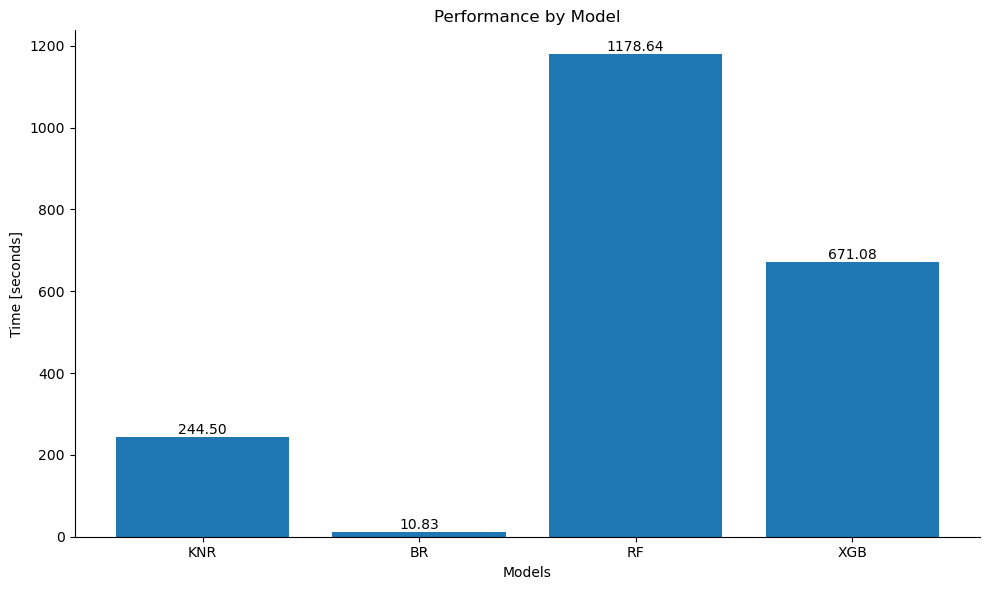

In [19]:
time_df = pd.DataFrame.from_dict(train_time, orient='index', columns=['Time'])

fig, axes = plt.subplots(figsize=(10, 6))

axes.bar(time_df.index, time_df['Time'])
axes.set_ylabel('Time [seconds]')
axes.set_xlabel('Models')
axes.set_title('Performance by Model')
axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
for value in axes.containers:
    axes.bar_label(value, fmt='%.2f', label_type='edge')
plt.grid(False)
plt.tight_layout()
plt.show()


### Test

In [20]:
# results from mice
test_result_knr = pd.read_csv('test_result_knr.csv').add_suffix('_KNR')
test_result_br = pd.read_csv('test_result_br.csv').add_suffix('_BR')
test_result_rf = pd.read_csv('test_result_rf.csv').add_suffix('_RF')
test_result_xgb = pd.read_csv('test_result_xgb.csv').add_suffix('_XGB')

In [21]:
test_df = test.copy()
test_df.reset_index(drop=True, inplace=True)

# merge mice results with the test data
test_df = test_df.merge(test_result_knr, left_index=True, right_index=True)
test_df = test_df.merge(test_result_br, left_index=True, right_index=True)
test_df = test_df.merge(test_result_rf, left_index=True, right_index=True)
test_df = test_df.merge(test_result_xgb, left_index=True, right_index=True)

In [22]:
test_df

,WELL,X,Y,DEPTH,RHOB,GR,DT,RES_10,SP,NPHI,...,DT_IMP_SCALED_XGB,RES_10_IMP_SCALED_XGB,SP_IMP_SCALED_XGB,NPHI_IMP_SCALED_XGB,RHOB_IMP_XGB,GR_IMP_XGB,DT_IMP_XGB,RES_10_IMP_XGB,SP_IMP_XGB,NPHI_IMP_XGB
0,1,482271.499734,6.052463e+06,1911.495,2.611854,149.843,226.255,1.277793,-143.182,0.112,...,0.222357,0.353515,0.678308,0.253291,2.590070,87.550287,206.377075,1.951312,537.830949,0.161017
1,1,482271.499734,6.052463e+06,1911.595,2.600693,125.852,216.665,1.241173,-141.921,0.115,...,0.212564,0.444433,0.357545,0.252822,2.614296,84.594241,203.259471,2.380061,112.205648,0.160719
2,1,482271.499734,6.052463e+06,1911.695,2.589293,103.401,208.990,1.212560,-140.275,0.118,...,0.246303,0.259947,0.197740,0.237854,2.621244,72.511549,214.000170,1.510063,-99.841467,0.151203
3,1,482271.499734,6.052463e+06,1911.795,2.577893,81.066,203.973,1.196121,-138.609,0.121,...,0.241846,0.261266,0.194905,0.224860,2.638566,54.414140,212.581084,1.516283,-103.603711,0.142944
4,1,482271.499734,6.052463e+06,1911.895,2.566492,58.731,200.262,1.184606,-136.542,0.125,...,0.247526,0.271526,0.169438,0.142825,2.659934,53.056302,214.389485,1.564665,-137.396597,0.090794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18641,16,388301.987252,6.173343e+06,1701.400,2.555700,150.120,199.460,0.674310,20.170,0.296,...,0.535430,0.283057,0.252228,0.241198,2.701975,142.292127,306.041970,1.619044,-27.541107,0.153329
18642,16,388301.987252,6.173343e+06,1701.600,2.624900,81.495,195.760,0.651181,18.500,0.253,...,0.476277,0.232109,0.254093,0.224926,2.719771,107.205566,287.210800,1.378783,-25.066532,0.142985
18643,16,388301.987252,6.173343e+06,1701.800,2.626500,45.150,192.320,0.586475,14.640,0.258,...,0.454128,0.234148,0.266590,0.235852,2.666815,100.558496,280.159828,1.388401,-8.483523,0.149931
18644,16,388301.987252,6.173343e+06,1702.000,2.639500,56.625,192.500,0.546296,11.280,0.281,...,0.346506,0.181309,0.212990,0.226415,2.699688,115.785269,245.899040,1.139223,-79.606270,0.143932


### 3.1. MICE Performance

In [23]:
well_logs = ['RHOB', 'GR', 'DT', 'RES_10', 'SP', 'NPHI']
models = ['KNR', 'BR', 'RF', 'XGB']

evaluation_results = {}
for log in well_logs:
    
    evaluation_results[log] = {}
    for model in models:

        column_name = f'{log}_{model}'
        
        original_values = test_df[f'{log}_SCALED_{model}'].dropna()
        original_index = list(original_values.index.values)
        imputed_values = test_df.loc[original_index, f'{log}_IMP_SCALED_{model}']
        
        mae = mean_absolute_error(original_values, imputed_values)
        mse = mean_squared_error(original_values, imputed_values)
        r2 = r2_score(original_values, imputed_values)
        
        evaluation_results[log][model] = {'R2': r2, 'NMAE': mae, 'NMSE': mse}

evaluation_results_df = {}
for log, models in evaluation_results.items():
    
    table_data = []
    for model, metrics in models.items():
        cols = {'Model': model, 'R2': metrics['R2'], 'NMAE': metrics['NMAE'], 'NMSE': metrics['NMSE']}
        table_data.append(cols)
    
    df = pd.DataFrame(table_data)
    
    evaluation_results_df[log] = df

for log, df in evaluation_results_df.items():
    print(f'Well-log: {log}')
    display(df.round(4).sort_values('NMSE', ascending=True))
    print('\n')

Well-log: RHOB


,Model,R2,NMAE,NMSE
3,XGB,0.3680,0.0322,0.0024
2,RF,0.3492,0.0339,0.0025
1,BR,0.2135,0.0403,0.0030
0,KNR,-0.0728,0.0445,0.0042




Well-log: GR


,Model,R2,NMAE,NMSE
1,BR,-1.1550,0.0483,0.0044
0,KNR,-1.3053,0.0468,0.0047
2,RF,-1.6662,0.0492,0.0054
3,XGB,-2.1997,0.0546,0.0065




Well-log: DT


,Model,R2,NMAE,NMSE
1,BR,0.2277,0.0367,0.0033
2,RF,0.0285,0.0413,0.0041
0,KNR,-0.1025,0.0426,0.0047
3,XGB,-0.1169,0.0423,0.0047




Well-log: RES_10


,Model,R2,NMAE,NMSE
3,XGB,0.1016,0.1070,0.0171
2,RF,-0.0387,0.1164,0.0198
0,KNR,-0.1746,0.1198,0.0224
1,BR,-0.3158,0.1188,0.0251




Well-log: SP


,Model,R2,NMAE,NMSE
2,RF,-17.6609,0.1489,0.0548
0,KNR,-18.1763,0.1555,0.0563
3,XGB,-21.4595,0.1388,0.0659
1,BR,-22.2791,0.1878,0.0684




Well-log: NPHI


,Model,R2,NMAE,NMSE
0,KNR,0.1157,0.0733,0.0080
3,XGB,0.1023,0.0727,0.0081
2,RF,0.0785,0.0731,0.0083
1,BR,-0.1842,0.0803,0.0107


In [24]:
r2_results_df = pd.DataFrame()
mae_results_df = pd.DataFrame()
mse_results_df = pd.DataFrame()

for log, df in evaluation_results_df.items():
    r2_results_df[log] = df['R2']
    mae_results_df[log] = df['NMAE']
    mse_results_df[log] = df['NMSE']

r2_results_df.index = df['Model']
mae_results_df.index = df['Model']
mse_results_df.index = df['Model']
    

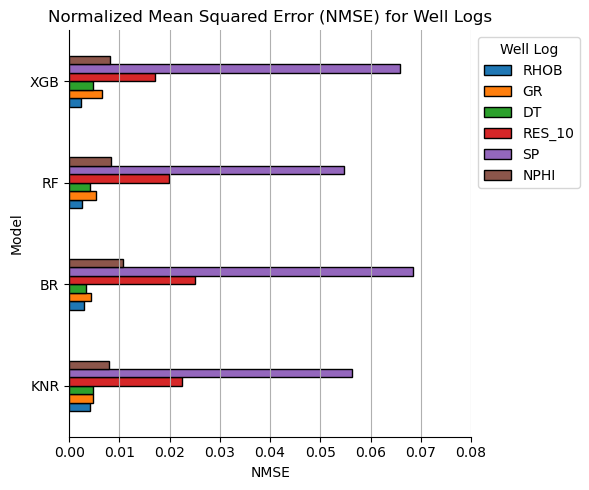

Model,KNR,BR,RF,XGB
RHOB,0.0042,0.0030,0.0025,0.0024
GR,0.0047,0.0044,0.0054,0.0065
DT,0.0047,0.0033,0.0041,0.0047
RES_10,0.0224,0.0251,0.0198,0.0171
SP,0.0563,0.0684,0.0548,0.0659
NPHI,0.0080,0.0107,0.0083,0.0081


In [25]:
ax = mse_results_df.plot(kind='barh', figsize=(6, 5), edgecolor='black')

plt.title('Normalized Mean Squared Error (NMSE) for Well Logs')
plt.ylabel('Model')
plt.xlabel('NMSE')

plt.xticks(rotation='horizontal')

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.xaxis.grid(True)
ax.legend(title='Well Log', bbox_to_anchor=(1, 1))

ax.set_xlim([0, 0.08])

plt.tight_layout() 
plt.show()

display(mse_results_df.T.round(4))

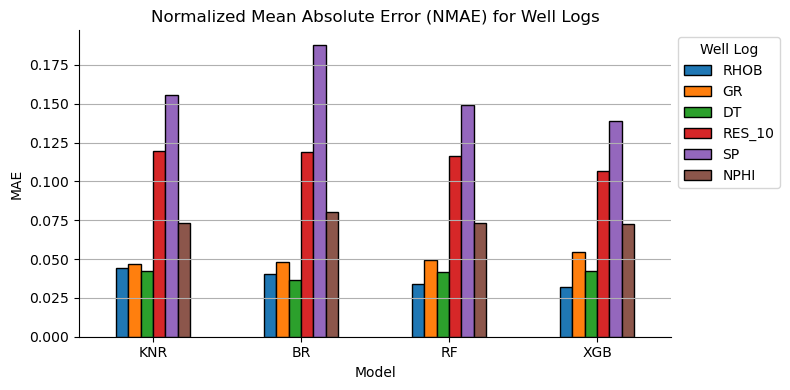

Model,KNR,BR,RF,XGB
RHOB,0.0445,0.0403,0.0339,0.0322
GR,0.0468,0.0483,0.0492,0.0546
DT,0.0426,0.0367,0.0413,0.0423
RES_10,0.1198,0.1188,0.1164,0.1070
SP,0.1555,0.1878,0.1489,0.1388
NPHI,0.0733,0.0803,0.0731,0.0727


In [26]:
ax = mae_results_df.plot(kind='bar', figsize=(8, 4), edgecolor='black')

plt.title('Normalized Mean Absolute Error (NMAE) for Well Logs')
plt.xlabel('Model')
plt.ylabel('MAE')

plt.xticks(rotation='horizontal')

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.yaxis.grid(True)
ax.legend(title='Well Log', bbox_to_anchor=(1, 1))

plt.tight_layout() 
plt.show()

# ax.set_ylim([0, 0.1])

display(mae_results_df.T.round(4))


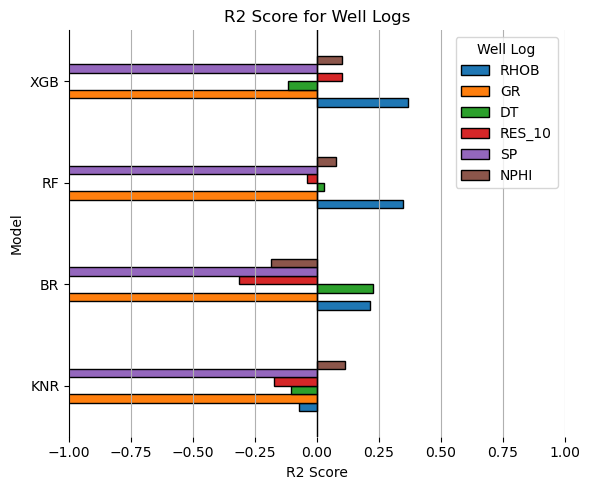

Model,KNR,BR,RF,XGB
RHOB,-0.07,0.21,0.35,0.37
GR,-1.31,-1.15,-1.67,-2.20
DT,-0.10,0.23,0.03,-0.12
RES_10,-0.17,-0.32,-0.04,0.10
SP,-18.18,-22.28,-17.66,-21.46
NPHI,0.12,-0.18,0.08,0.10


In [27]:
ax = r2_results_df.plot(kind='barh', figsize=(6, 5), edgecolor='black')

plt.title('R2 Score for Well Logs')
plt.ylabel('Model')
plt.xlabel('R2 Score')
ax.legend(title='Well Log', bbox_to_anchor=(1, 1))
plt.xticks(rotation='horizontal')
plt.axvline(0, color='black', linewidth=1)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)

ax.xaxis.grid(True)

ax.set_xlim([-1, 1])

plt.tight_layout()  
plt.show()
display(r2_results_df.T.round(2))


### 3.2. Performance by Well

In [28]:
# non-missing values for each columns
missing_wells = pd.DataFrame({'Non-Missing': test.count()/test.shape[0]})

# missing values for each well
for well, df in test.groupby('WELL'):
    missing_wells[well] = 1 - (df.count() / df.shape[0])
    
missing_wells = missing_wells.T

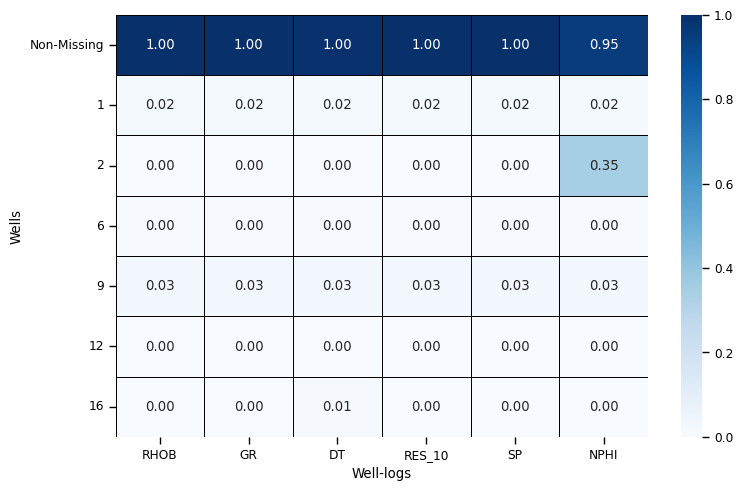

In [33]:
# fraction of missing values for each well
fig = plt.figure(figsize=(8, 5))
sns.set_context('paper')
cmap = sns.color_palette(palette='Blues', as_cmap=True)
axes = sns.heatmap(missing_wells[well_logs], linecolor='black', linewidths=0.5, vmin=0, vmax=1, cmap=cmap, annot=True, fmt='.2f')
axes.set_xlabel('Well-logs')
axes.set_ylabel('Wells')
axes.set_yticklabels(axes.get_yticklabels(), rotation=0)
plt.tight_layout()


In [29]:
unique_wells = test_df['WELL'].unique()

well_logs = ['RHOB', 'GR', 'DT', 'RES_10', 'SP', 'NPHI']
models = ['KNR', 'BR', 'RF', 'XGB']

# NMSE and R2
for well in unique_wells:
    well_data = test_df.loc[test_df['WELL'] == well]
    
    print('Blind-Well:', well)
    
    evaluation_results = {}
    for log in well_logs:

        evaluation_results[log] = {}
        for model in models:

            column_name = f'{log}_{model}'
            
            original_values = well_data[f'{log}_SCALED_{model}'].dropna()
            original_index = list(original_values.index.values)
            imputed_values = well_data.loc[original_index, f'{log}_IMP_SCALED_{model}']

            
            if original_values.notnull().any():
            
                mae = mean_absolute_error(original_values, imputed_values)
                mse = mean_squared_error(original_values, imputed_values)
                r2 = r2_score(original_values, imputed_values)
            else:
                mae, mse, r2 = None, None, None

            evaluation_results[log][model] = {'R2': r2, 'NMAE': mae, 'NMSE': mse}

    evaluation_results_df = {}
    for log, models in evaluation_results.items():

        table_data = []
        for model, metrics in models.items():
            cols = {'Model': model, 'R2': metrics['R2'], 'NMAE': metrics['NMAE'], 'NMSE': metrics['NMSE']}
            table_data.append(cols)

        df = pd.DataFrame(table_data)

        evaluation_results_df[log] = df


    r2_results_df = pd.DataFrame()
    mae_results_df = pd.DataFrame()
    mse_results_df = pd.DataFrame()

    for log, df in evaluation_results_df.items():
        r2_results_df[log] = df['R2']
        mae_results_df[log] = df['NMAE']
        mse_results_df[log] = df['NMSE']

    r2_results_df.index = df['Model']
    mae_results_df.index = df['Model']
    mse_results_df.index = df['Model']
    
    # results
    print('NMSE')
    display(mse_results_df.T.mean())
    print('R2')
    display(r2_results_df.T.mean())
    
    print('\n')
    
    

Blind-Well: 1
NMSE


Model
KNR    0.006672
BR     0.005763
RF     0.009409
XGB    0.006939
dtype: float64

R2


Model
KNR    -7.747478
BR     -4.802595
RF    -10.191282
XGB    -9.208678
dtype: float64



Blind-Well: 2
NMSE


Model
KNR    0.014552
BR     0.024399
RF     0.019852
XGB    0.014285
dtype: float64

R2


Model
KNR    -7.909574
BR    -13.951513
RF    -11.456709
XGB    -6.373531
dtype: float64



Blind-Well: 6
NMSE


Model
KNR    0.014306
BR     0.043881
RF     0.018640
XGB    0.018073
dtype: float64

R2


Model
KNR    -19.236679
BR    -111.290974
RF     -22.257114
XGB    -23.358071
dtype: float64



Blind-Well: 9
NMSE


Model
KNR    0.010465
BR     0.018041
RF     0.006938
XGB    0.014495
dtype: float64

R2


Model
KNR    -20.967435
BR    -356.999954
RF     -10.987245
XGB    -49.674391
dtype: float64



Blind-Well: 12
NMSE


Model
KNR    0.019353
BR     0.016251
RF     0.016572
XGB    0.020131
dtype: float64

R2


Model
KNR   -8.120104
BR    -6.828647
RF    -7.105783
XGB   -9.740529
dtype: float64



Blind-Well: 16
NMSE


Model
KNR    0.011276
BR     0.023955
RF     0.009991
XGB    0.010507
dtype: float64

R2


Model
KNR    -4.401185
BR    -11.118800
RF     -4.421491
XGB    -4.383620
dtype: float64

In [30]:
test['WELL'] = test['WELL'].astype(str)

well_counts = test.groupby('WELL').count()
well_counts['Total'] = test.groupby('WELL').size()

well_counts_sorted = well_counts.sort_values(by='Total')
well_counts_sorted['Total']


WELL
9       588
1      1026
6      1279
16     1500
2      2400
12    11853
Name: Total, dtype: int64

In [31]:
test['WELL'].unique().tolist()

['1', '2', '6', '9', '12', '16']

In [32]:
wells = ['1', '2', '6', '9', '12', '16']

avg_nmse = [0.0072, 0.0183, 0.0237, 0.0125, 0.0181, 0.0139]
avg_r2 = [-7.9875, -9.9228, -44.0357, -109.6573, -7.9488, -6.0813]

data_wells = {'WELLS': wells,
              'AVG_NMSE': avg_nmse,
              'AVG_R2': avg_r2
             }

df_wells = pd.DataFrame(data_wells)

df_wells = df_wells.merge(well_counts_sorted[['Total']], how='left', left_on='WELLS', right_index=True)
df_wells.rename(columns={'Total': 'TOTAL'}, inplace=True)
df_wells.sort_values(by='TOTAL', ascending=False, inplace=True)

df_wells


,WELLS,AVG_NMSE,AVG_R2,TOTAL
4,12,0.0181,-7.9488,11853
1,2,0.0183,-9.9228,2400
5,16,0.0139,-6.0813,1500
2,6,0.0237,-44.0357,1279
0,1,0.0072,-7.9875,1026
3,9,0.0125,-109.6573,588


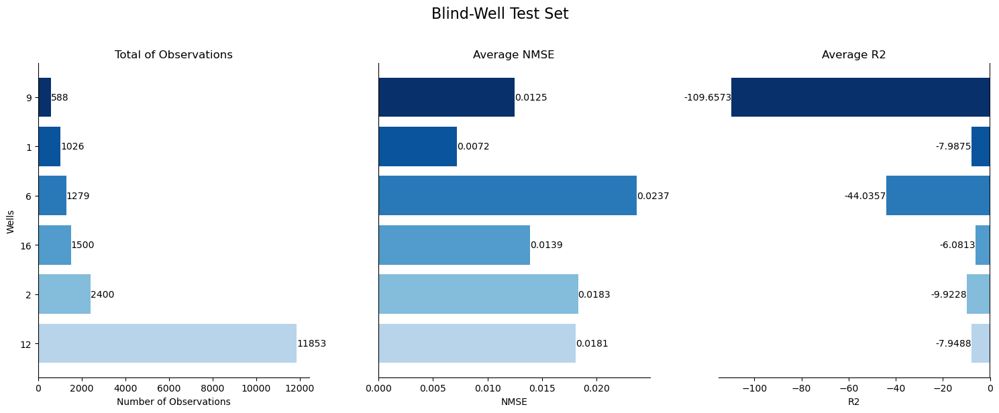

In [33]:
num_wells = len(df_wells)
colors = plt.cm.Blues(np.linspace(0.3, 1, num_wells))

fig, axes = plt.subplots(1, 3, figsize=(15, 6))

plt.suptitle('Blind-Well Test Set', fontsize=16, y=1.02)

axes[0].barh(df_wells['WELLS'], df_wells['TOTAL'], color=colors)
axes[0].set_xlabel('Number of Observations')
axes[0].set_ylabel('Wells')
axes[0].set_title('Total of Observations')
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
for value in axes[0].containers:
    axes[0].bar_label(value, label_type='edge')
plt.grid(False)


axes[1].barh(df_wells['WELLS'], df_wells['AVG_NMSE'], color=colors)
axes[1].set_xlabel('NMSE')
axes[1].set_title('Average NMSE')
axes[1].spines['right'].set_visible(False)
axes[1].spines['top'].set_visible(False)
axes[1].yaxis.set_visible(False)
for value in axes[1].containers:
    axes[1].bar_label(value, fmt='%.4f', label_type='edge')
plt.grid(False)

axes[2].barh(df_wells['WELLS'], df_wells['AVG_R2'], color=colors)
axes[2].set_xlabel('R2')
axes[2].set_title('Average R2')
axes[2].spines['right'].set_visible(False)
axes[2].spines['top'].set_visible(False)
axes[2].spines['left'].set_visible(False)
axes[2].yaxis.set_visible(False)
axes[2].axvline(x=0, color='black')

# axes[2].set_xlim(-1, 1)
for value in axes[2].containers:
    axes[2].bar_label(value, fmt='%.4f', label_type='edge')
plt.grid(False)

plt.tight_layout()
plt.show()


### 3.3. Performance by Stratigraphy

#### Train

In [34]:
# non-missing values for each columns
missing_strat = pd.DataFrame({'Non-Missing': train.count()/train.shape[0]})

# missing values for each stratigraphy
for well, df in train.groupby('STRAT'):
    missing_strat[well] = 1 - (df.count() / df.shape[0])
    
missing_strat = missing_strat.T

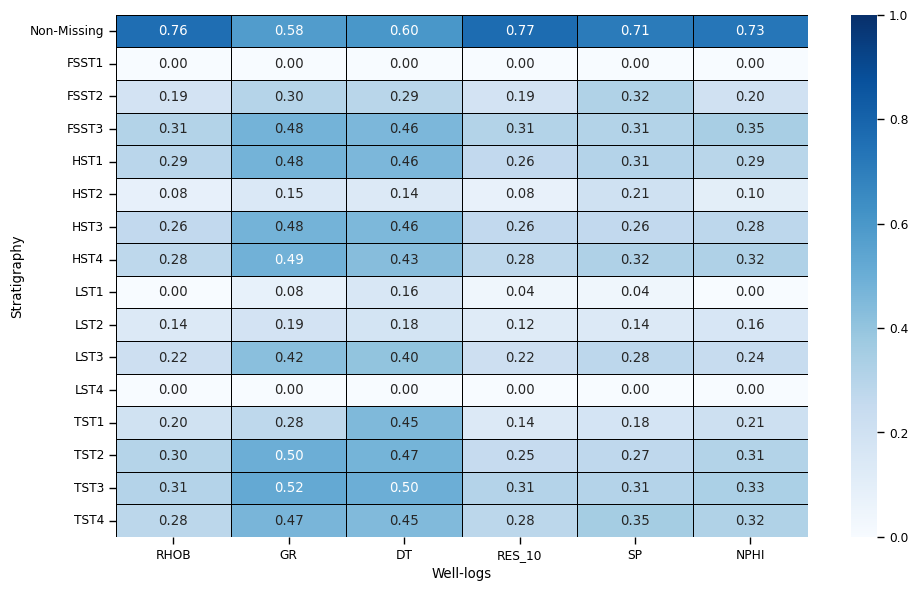

In [40]:
# fraction of missing values for each stratigraphy
fig = plt.figure(figsize=(10, 6))
sns.set_context('paper')
cmap = sns.color_palette(palette='Blues', as_cmap=True)
axes = sns.heatmap(missing_strat[well_logs], linecolor='black', linewidths=0.5, vmin=0, vmax=1, cmap=cmap, annot=True, fmt='.2f')
axes.set_xlabel('Well-logs')
axes.set_ylabel('Stratigraphy')
plt.tight_layout()


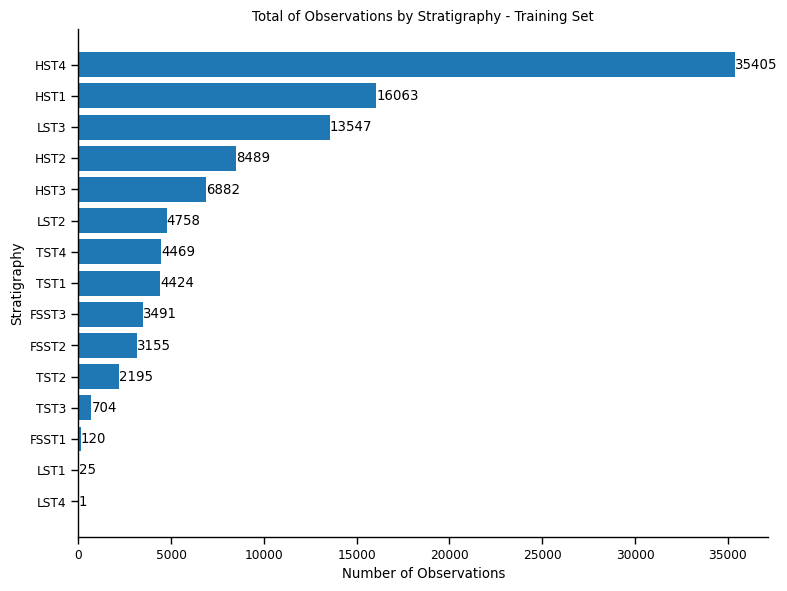

In [41]:
# count the number of observations for each stratigraphy
strat_counts = train.groupby('STRAT').count()
strat_counts['Total'] = train.groupby('STRAT').size()

# sort stratigraphy by total number of observations
strat_counts_sorted = strat_counts.sort_values(by='Total')

# plot the results
fig, axes = plt.subplots(figsize=(8,6))
axes.barh(strat_counts_sorted.index, strat_counts_sorted['Total'].values)
axes.set_xlabel('Number of Observations')
axes.set_ylabel('Stratigraphy')
axes.set_title('Total of Observations by Stratigraphy - Training Set')
axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)

# add count values to each bar
for value in axes.containers:
    axes.bar_label(value, label_type='edge')
plt.grid(False)
plt.tight_layout()
plt.show()


#### Test

In [42]:
# non-missing values for each columns
missing_strat = pd.DataFrame({'Non-Missing': test.count()/test.shape[0]})

# missing values for each stratigraphy
for well, df in test.groupby('STRAT'):
    missing_strat[well] = 1 - (df.count() / df.shape[0])
    
missing_strat = missing_strat.T

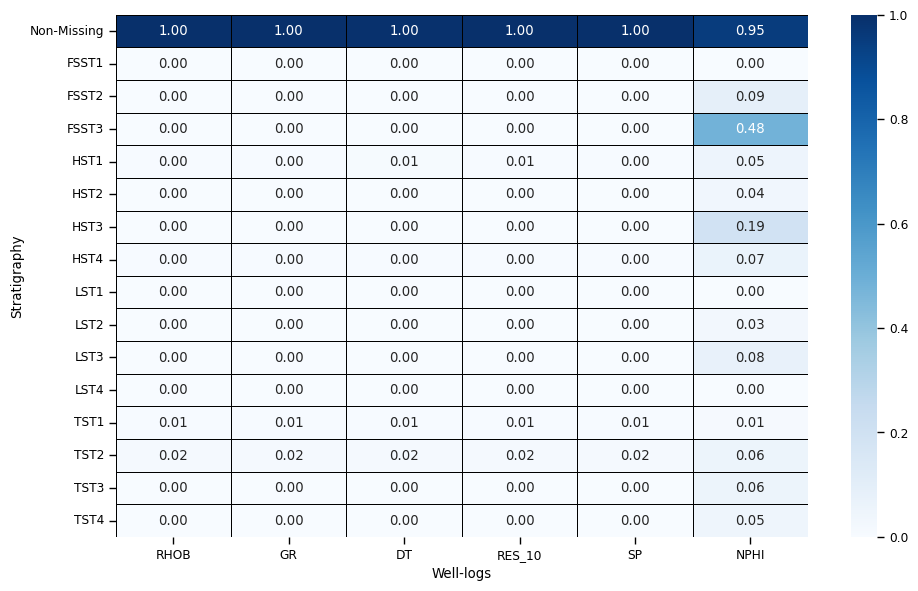

In [43]:
# fraction of missing values for each stratigraphy
fig = plt.figure(figsize=(10, 6))
sns.set_context('paper')
cmap = sns.color_palette(palette='Blues', as_cmap=True)
axes = sns.heatmap(missing_strat[well_logs], linecolor='black', linewidths=0.5, vmin=0, vmax=1, cmap=cmap, annot=True, fmt='.2f')
axes.set_xlabel('Well-logs')
axes.set_ylabel('Stratigraphy')
plt.tight_layout()


In [35]:
unique_strat = ['TST3', 'TST2', 
                'LST2', 'HST1', 'TST1', 'HST4', 'TST4', 
                'FSST3', 'HST3', 'LST3', 'FSST2', 'HST2']

well_logs = ['RHOB', 'GR', 'DT', 'RES_10', 'SP', 'NPHI']
models = ['KNR', 'BR', 'RF', 'XGB']

# NMSE and R2
for strat in unique_strat:
    strat_data = test_df.loc[test_df['STRAT'] == strat]
    
    print('Stratigraphy:', strat)
    
    evaluation_results = {}
    for log in well_logs:

        evaluation_results[log] = {}
        for model in models:

            column_name = f'{log}_{model}'

            original_values = strat_data[f'{log}_SCALED_{model}'].dropna()
            original_index = list(original_values.index.values)
            imputed_values = strat_data.loc[original_index, f'{log}_IMP_SCALED_{model}']

            
            if original_values.notnull().any():
            
                mae = mean_absolute_error(original_values, imputed_values)
                mse = mean_squared_error(original_values, imputed_values)
                r2 = r2_score(original_values, imputed_values)
            else:
                mae, mse, r2 = None, None, None

            evaluation_results[log][model] = {'R2': r2, 'NMAE': mae, 'NMSE': mse}

    evaluation_results_df = {}
    for log, models in evaluation_results.items():

        table_data = []
        for model, metrics in models.items():
            cols = {'Model': model, 'R2': metrics['R2'], 'NMAE': metrics['NMAE'], 'NMSE': metrics['NMSE']}
            table_data.append(cols)

        df = pd.DataFrame(table_data)

        evaluation_results_df[log] = df


    r2_results_df = pd.DataFrame()
    mae_results_df = pd.DataFrame()
    mse_results_df = pd.DataFrame()

    for log, df in evaluation_results_df.items():
        r2_results_df[log] = df['R2']
        mae_results_df[log] = df['NMAE']
        mse_results_df[log] = df['NMSE']

    r2_results_df.index = df['Model']
    mae_results_df.index = df['Model']
    mse_results_df.index = df['Model']
    
    # results
    print('NMSE')
    display(mse_results_df.T.mean())
    print('R2')
    display(r2_results_df.T.mean())
    
    print('\n')
    

Stratigraphy: TST3
NMSE


Model
KNR    0.020409
BR     0.051962
RF     0.021812
XGB    0.011480
dtype: float64

R2


Model
KNR   -59.543494
BR    -71.121254
RF    -50.293683
XGB   -12.624013
dtype: float64



Stratigraphy: TST2
NMSE


Model
KNR    0.012394
BR     0.016265
RF     0.011462
XGB    0.012153
dtype: float64

R2


Model
KNR   -2.327233
BR    -3.502032
RF    -1.883670
XGB   -2.153513
dtype: float64



Stratigraphy: LST2
NMSE


Model
KNR    0.007950
BR     0.009318
RF     0.006370
XGB    0.005232
dtype: float64

R2


Model
KNR   -2.340820
BR    -3.986688
RF    -2.166544
XGB   -1.343664
dtype: float64



Stratigraphy: HST1
NMSE


Model
KNR    0.011960
BR     0.015591
RF     0.011811
XGB    0.010358
dtype: float64

R2


Model
KNR   -1.513126
BR    -2.596024
RF    -1.640244
XGB   -1.336179
dtype: float64



Stratigraphy: TST1
NMSE


Model
KNR    0.010110
BR     0.016312
RF     0.011375
XGB    0.008991
dtype: float64

R2


Model
KNR   -1.727869
BR    -3.716717
RF    -2.135891
XGB   -1.927688
dtype: float64



Stratigraphy: HST4
NMSE


Model
KNR    0.036887
BR     0.034675
RF     0.035310
XGB    0.053508
dtype: float64

R2


Model
KNR    -9.918594
BR     -8.807345
RF     -9.496197
XGB   -16.057107
dtype: float64



Stratigraphy: TST4
NMSE


Model
KNR    0.039872
BR     0.057035
RF     0.032964
XGB    0.026185
dtype: float64

R2


Model
KNR   -10.680267
BR    -13.103151
RF     -8.220908
XGB    -6.364985
dtype: float64



Stratigraphy: FSST3
NMSE


Model
KNR    0.026400
BR     0.027425
RF     0.023488
XGB    0.023394
dtype: float64

R2


Model
KNR   -255.125225
BR    -146.792788
RF    -183.593850
XGB   -191.483197
dtype: float64



Stratigraphy: HST3
NMSE


Model
KNR    0.018602
BR     0.039700
RF     0.022794
XGB    0.011500
dtype: float64

R2


Model
KNR   -106.359710
BR    -253.094689
RF    -149.015518
XGB    -45.854862
dtype: float64



Stratigraphy: LST3
NMSE


Model
KNR    0.010414
BR     0.036716
RF     0.027049
XGB    0.015714
dtype: float64

R2


Model
KNR    -2.257254
BR    -18.251720
RF    -14.561372
XGB    -4.068507
dtype: float64



Stratigraphy: FSST2
NMSE


Model
KNR    0.012238
BR     0.003038
RF     0.006067
XGB    0.004821
dtype: float64

R2


Model
KNR   -4.962734
BR    -1.786421
RF    -3.141790
XGB   -2.405776
dtype: float64



Stratigraphy: HST2
NMSE


Model
KNR    0.006546
BR     0.004923
RF     0.004898
XGB    0.003263
dtype: float64

R2


Model
KNR   -3.666562
BR    -3.854715
RF    -2.375903
XGB   -1.384294
dtype: float64

In [37]:
strat_counts = test.groupby('STRAT').count()
strat_counts['Total'] = test.groupby('STRAT').size()

strat_counts_sorted = strat_counts.sort_values(by='Total')
strat_counts_sorted['Total']

STRAT
FSST1       1
LST1        1
LST4        1
TST3       18
FSST3      81
HST3      175
TST2      177
LST3      514
FSST2     711
TST4     1093
LST2     1569
TST1     2607
HST1     3322
HST4     3713
HST2     4663
Name: Total, dtype: int64

In [46]:
test['STRAT'].unique().tolist()

['TST3',
 'TST2',
 'LST2',
 'HST1',
 'TST1',
 'LST1',
 'HST4',
 'TST4',
 'FSST3',
 'HST3',
 'LST3',
 'FSST2',
 'HST2',
 'FSST1',
 'LST4']

In [66]:
strats = ['TST3', 'TST2', 
          'LST2', 'HST1', 'TST1', 'HST4', 'TST4', 
          'FSST3', 'HST3', 'LST3', 'FSST2', 'HST2']

avg_nmse = [0.0264, 0.0131, 0.0072, 0.0124, 0.0117, 0.0401, 
            0.0390, 0.0252, 0.0231, 0.0225, 0.0065, 0.0049]

avg_r2 = [-48.3956, -2.4666, -2.4594, -1.7714, -2.3770, -11.0698,
          -9.5923, -194.2488, -138.5812, -9.7847, -3.0742, -2.8204]

data_strats = {'STRATS': strats,
              'AVG_NMSE': avg_nmse,
              'AVG_R2': avg_r2
             }

df_strats = pd.DataFrame(data_strats)

df_strats = df_strats.merge(strat_counts_sorted[['Total']], how='left', left_on='STRATS', right_index=True)
df_strats.rename(columns={'Total': 'TOTAL'}, inplace=True)
df_strats.sort_values(by='TOTAL', ascending=False, inplace=True)

df_strats


,STRATS,AVG_NMSE,AVG_R2,TOTAL
11,HST2,0.0049,-2.8204,4663
5,HST4,0.0401,-11.0698,3713
3,HST1,0.0124,-1.7714,3322
4,TST1,0.0117,-2.3770,2607
2,LST2,0.0072,-2.4594,1569
6,TST4,0.0390,-9.5923,1093
10,FSST2,0.0065,-3.0742,711
9,LST3,0.0225,-9.7847,514
1,TST2,0.0131,-2.4666,177
8,HST3,0.0231,-138.5812,175


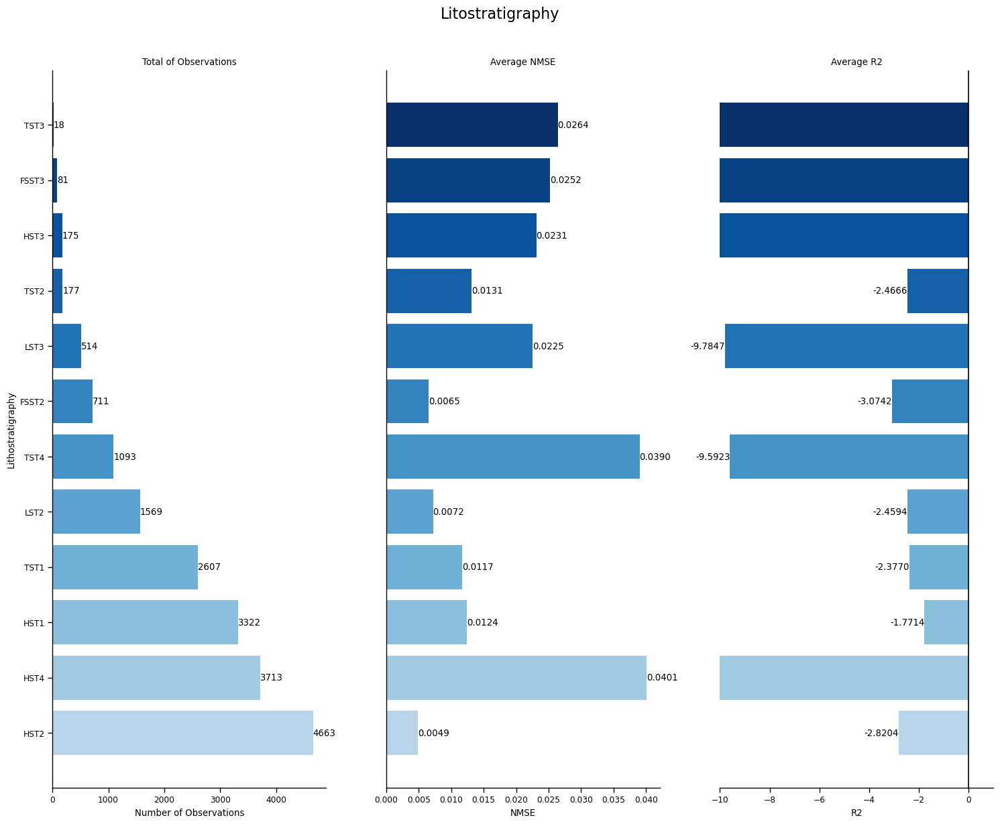

In [65]:
num_strat = len(df_strats)
colors = plt.cm.Blues(np.linspace(0.3, 1, num_strat))

fig, axes = plt.subplots(1, 3, figsize=(15, 12))

plt.suptitle('Litostratigraphy', fontsize=16, y=1.02)

axes[0].barh(df_strats['STRATS'], df_strats['TOTAL'], color=colors)
axes[0].set_xlabel('Number of Observations')
axes[0].set_ylabel('Lithostratigraphy')
axes[0].set_title('Total of Observations')
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
for value in axes[0].containers:
    axes[0].bar_label(value, label_type='edge')
plt.grid(False)

axes[1].barh(df_strats['STRATS'], df_strats['AVG_NMSE'], color=colors)
axes[1].set_xlabel('NMSE')
axes[1].set_ylabel('Lithostratigraphy')
axes[1].set_title('Average NMSE')
axes[1].spines['right'].set_visible(False)
axes[1].spines['top'].set_visible(False)
axes[1].yaxis.set_visible(False)

# axes[1].yaxis.set_visible(False)
for value in axes[1].containers:
    axes[1].bar_label(value, fmt='%.4f', label_type='edge')
plt.grid(False)

axes[2].barh(df_strats['STRATS'], df_strats['AVG_R2'], color=colors)
axes[2].set_xlabel('R2')
axes[2].set_title('Average R2')
axes[2].spines['right'].set_visible(False)
axes[2].spines['top'].set_visible(False)
axes[2].spines['left'].set_visible(False)
axes[2].yaxis.set_visible(False)
axes[2].axvline(x=0, color='black')

axes[2].set_xlim(-10, 1)
for value in axes[2].containers:
    axes[2].bar_label(value, fmt='%.4f', label_type='edge')
plt.grid(False)

plt.tight_layout()
plt.show()

### 3.4. Plotting Well-logs

In [35]:
def results_wells(df, features, name_well, model): 
    
    well = df[df['WELL'] == name_well] 


    fig, ax = plt.subplots(nrows=1, ncols=len(features), figsize=(15,10))

    for idx, feature in enumerate(features):
        if well[feature].notnull().any():
            ax[idx].plot(well[f'{feature}'], well['DEPTH'], marker='.', markersize=1, linewidth=0.8, alpha=0.5, color='blue', label='Original')
            ax[idx].plot(well[f'{feature}_IMP_{model}'], well['DEPTH'], linewidth=0.6, color='red', alpha=0.8, label='Predicted')
    #                 ax[idx].plot(well[f'{feature}_MICE'], well['DEPTH'], marker='o', linewidth=0.6, markersize=0.5, color='red', alpha=0.8, label='Predicted')
            ax[idx].set_ylim([min(well['DEPTH']), max(well['DEPTH'])])
            ax[idx].invert_yaxis()
            ax[idx].set_xlabel(feature)

            if idx == 0:
                ax[idx].set_ylabel('DEPTH')

            if feature == 'R10':
                ax[idx].set_xscale('log')

            ax[idx].grid(True) 
    ax[idx].legend()
    fig.suptitle(f'Well {name_well} - Model {model}', fontsize=16)
    plt.tight_layout()
    plt.show()
    
    
def results_wells_scatter(df, features, name_well, model): 
    
    well = df[df['WELL'] == name_well] 


    fig, ax = plt.subplots(nrows=1, ncols=len(features), figsize=(20, 4))

    for idx, feature in enumerate(features):
        if well[feature].notnull().any():
            sns.scatterplot(data=well, x=f'{feature}', y=f'{feature}_IMP_{model}', hue='STRAT', ax=ax[idx])
#             ax[idx].set_ylim([min(well['DEPTH']), max(well['DEPTH'])])
#             ax[idx].invert_yaxis()
            ax[idx].set_xlabel(feature)

            ax[idx].grid(True) 
    ax[idx].legend()
    fig.suptitle(f'Well {name_well} - Model {model}', fontsize=16)
    plt.tight_layout()
    plt.show()

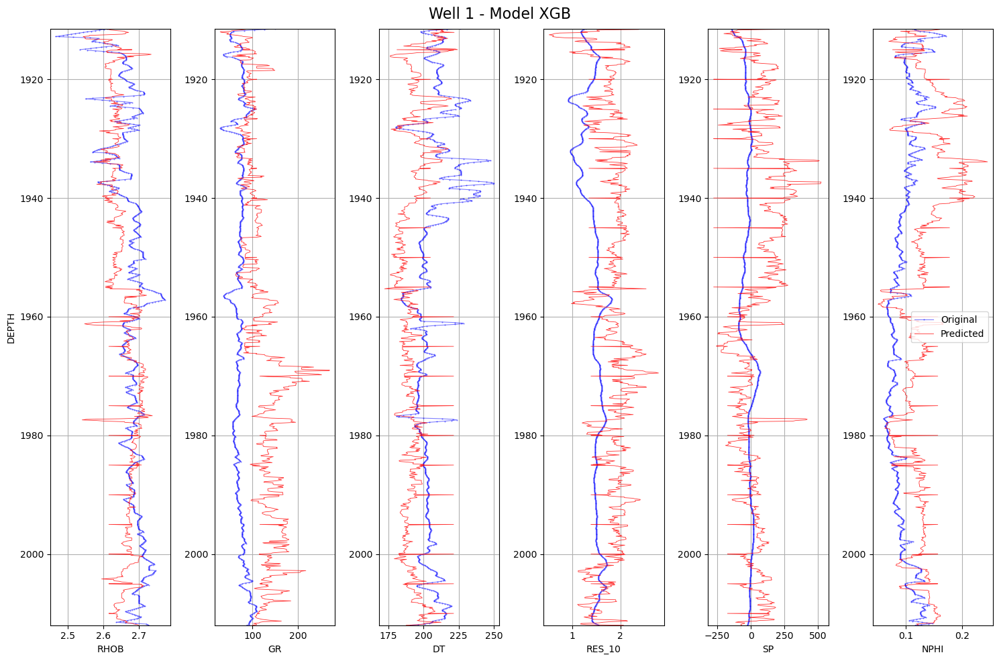

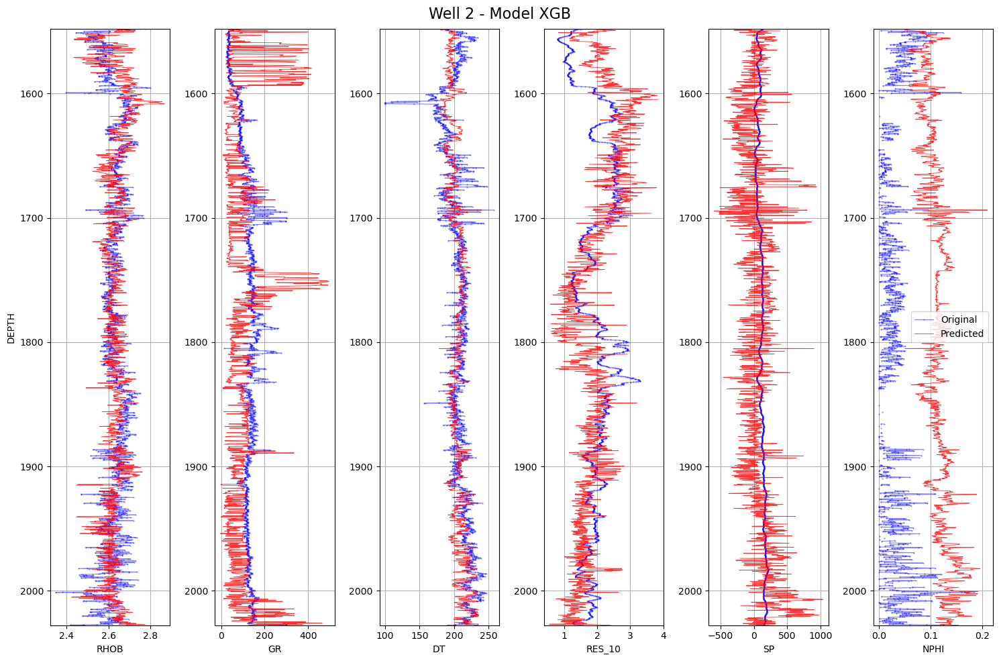

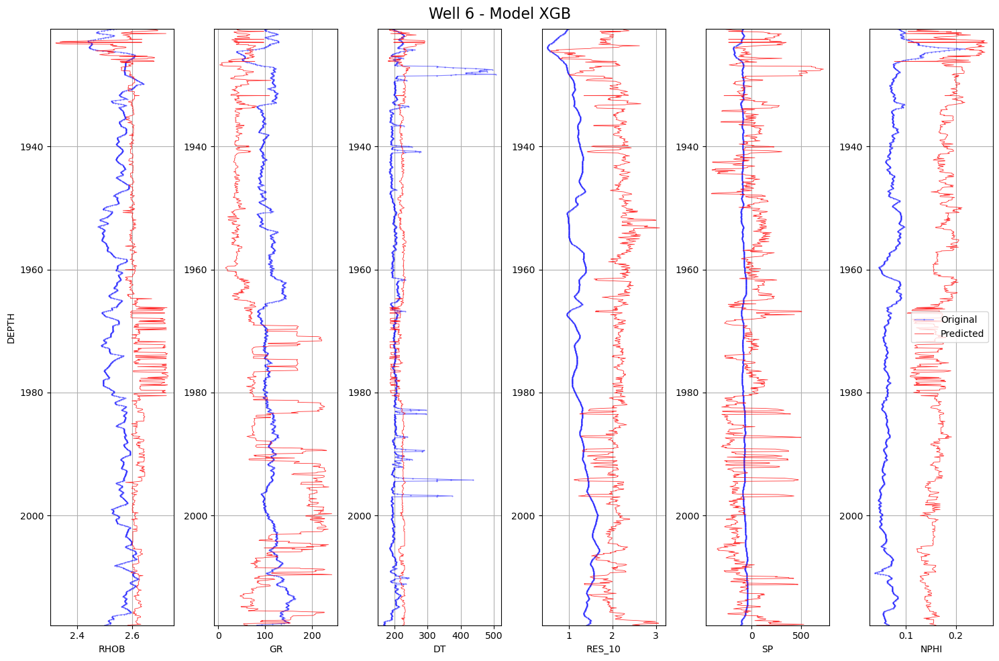

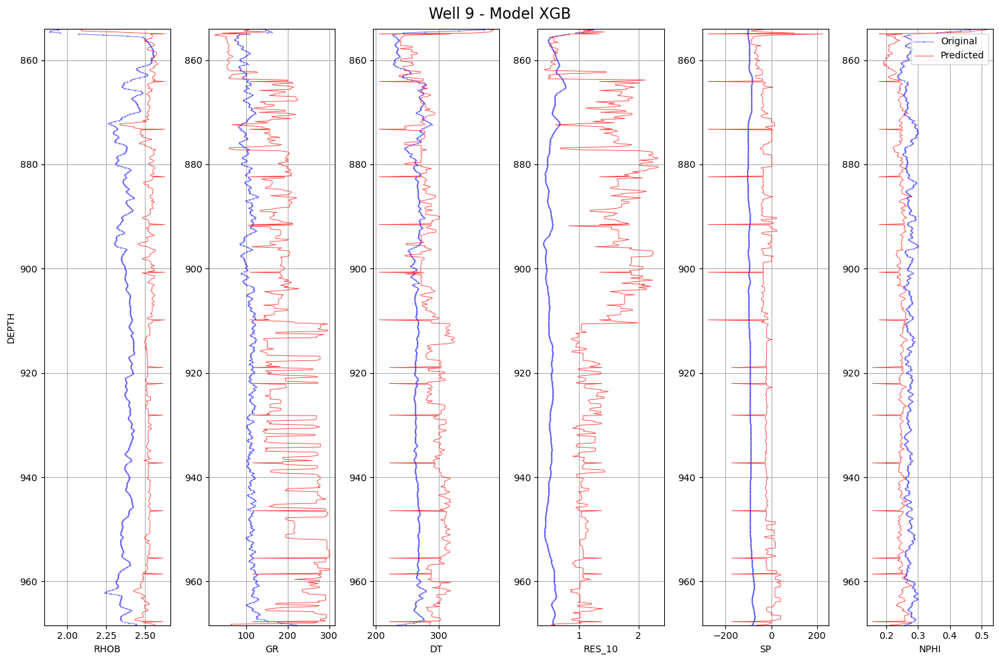

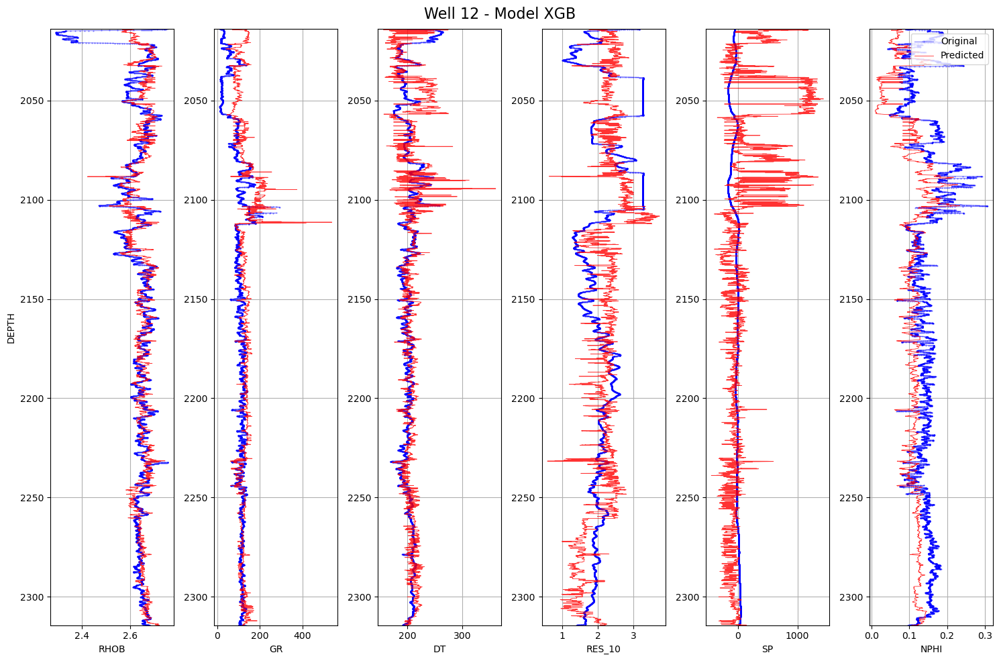

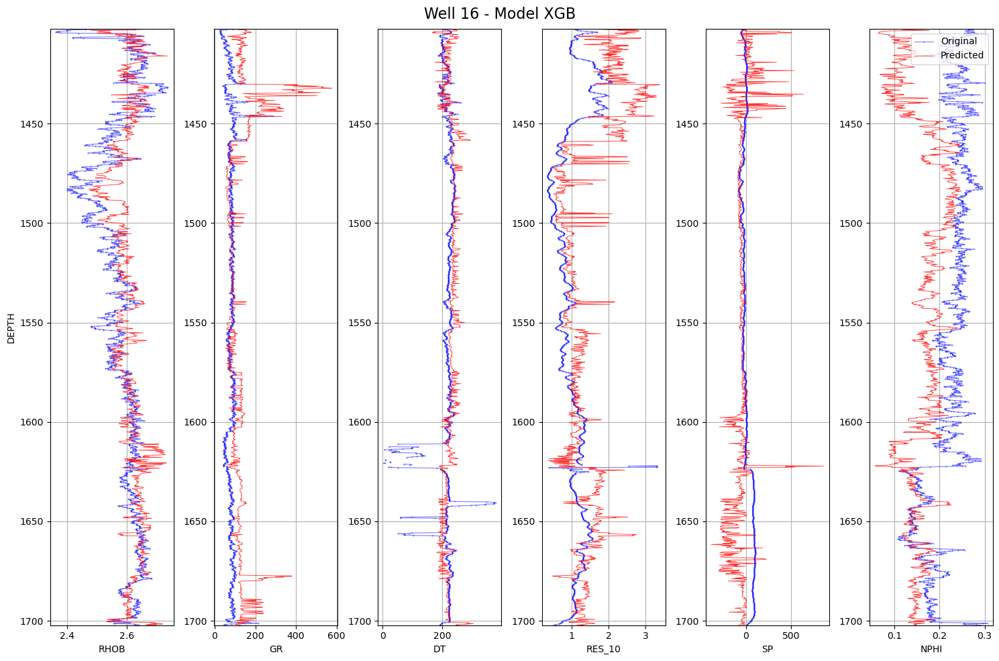

In [38]:
well_logs = ['RHOB', 'GR', 'DT', 'RES_10', 'SP', 'NPHI']

models = ['XGB']

test_wells_plot = test_df['WELL'].unique()
# test_wells_plot = [9, 1, 12, 16]

for well in test_wells_plot:
    for model in models:
    
        results_wells(df=test_df, features=well_logs, name_well=well, model=model) 

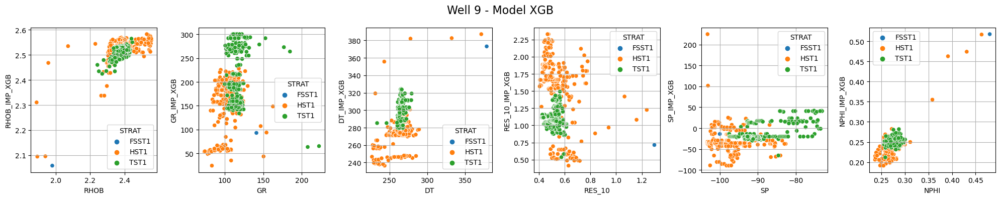

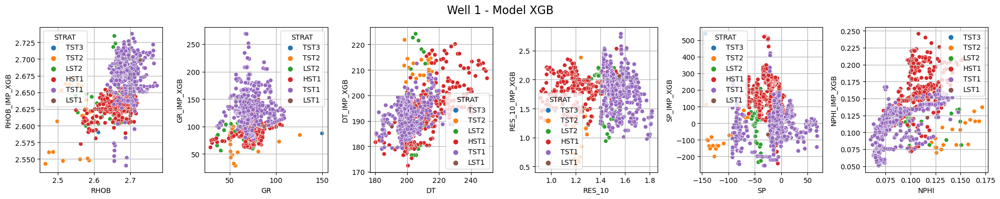

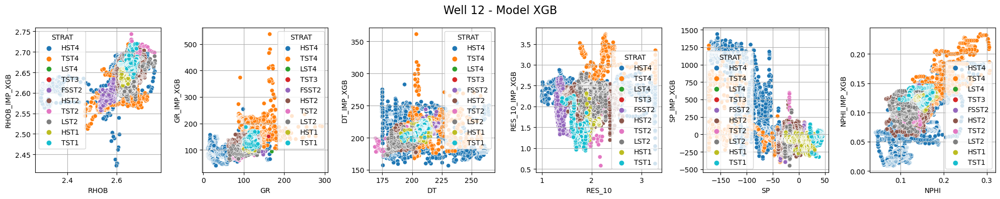

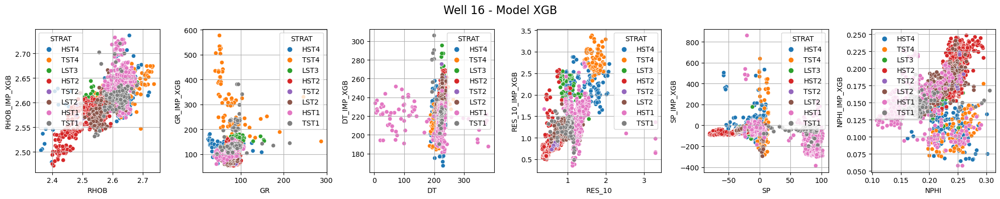

In [37]:
well_logs = ['RHOB', 'GR', 'DT', 'RES_10', 'SP', 'NPHI']
# model = 'BR'
models = ['XGB']

# test_wells_plot = test_df['WELL'].unique()
test_wells_plot = [9, 1, 12, 16]

for well in test_wells_plot:
    for model in models:
    
        results_wells_scatter(df=test_df, features=well_logs, name_well=well, model=model) 

### 3.5. Plotting Stratigraphy

In [55]:
def results_wells_strat(df, features, name_well, model, lito_strat):
    strat_df = df[df['STRAT'] == lito_strat] 
    
    
    well = strat_df[strat_df['WELL'] == name_well] 


    fig, ax = plt.subplots(nrows=1, ncols=len(features), figsize=(15,10))

    for idx, feature in enumerate(features):
        if well[feature].notnull().any():
            ax[idx].plot(well[f'{feature}'], well['DEPTH'], marker='.', markersize=1, linewidth=0.8, alpha=0.5, color='blue', label='Original')
            ax[idx].plot(well[f'{feature}_IMP_{model}'], well['DEPTH'], linewidth=0.6, color='red', alpha=0.8, label='Predicted')
    #                 ax[idx].plot(well[f'{feature}_MICE'], well['DEPTH'], marker='o', linewidth=0.6, markersize=0.5, color='red', alpha=0.8, label='Predicted')
            ax[idx].set_ylim([min(well['DEPTH']), max(well['DEPTH'])])
            ax[idx].invert_yaxis()
            ax[idx].set_xlabel(feature)

            if idx == 0:
                ax[idx].set_ylabel('DEPTH')

            if feature == 'R10':
                ax[idx].set_xscale('log')

            ax[idx].grid(True) 
    ax[idx].legend()
    fig.suptitle(f'Well {name_well} - Model {model} - Litostratigraphy {lito_strat}', fontsize=16)
    plt.tight_layout()
    plt.show()
    
def results_wells_strat_scatter(df, features, name_well, model, lito_strat):
    strat_df = df[df['STRAT'] == lito_strat] 
    
    
    well = strat_df[strat_df['WELL'] == name_well] 


    fig, ax = plt.subplots(nrows=1, ncols=len(features), figsize=(20, 4))

    for idx, feature in enumerate(features):
        if well[feature].notnull().any():
            sns.scatterplot(data=well, x=f'{feature}', y=f'{feature}_IMP_{model}', hue='LITHO', ax=ax[idx])

            ax[idx].grid(True) 
    ax[idx].legend()
    fig.suptitle(f'Well {name_well} - Model {model} - Litostratigraphy {lito_strat}', fontsize=16)
    plt.tight_layout()
    plt.show()
    

In [56]:
test['STRAT'].unique().tolist()

['TST3',
 'TST2',
 'LST2',
 'HST1',
 'TST1',
 'LST1',
 'HST4',
 'TST4',
 'FSST3',
 'HST3',
 'LST3',
 'FSST2',
 'HST2',
 'FSST1',
 'LST4']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


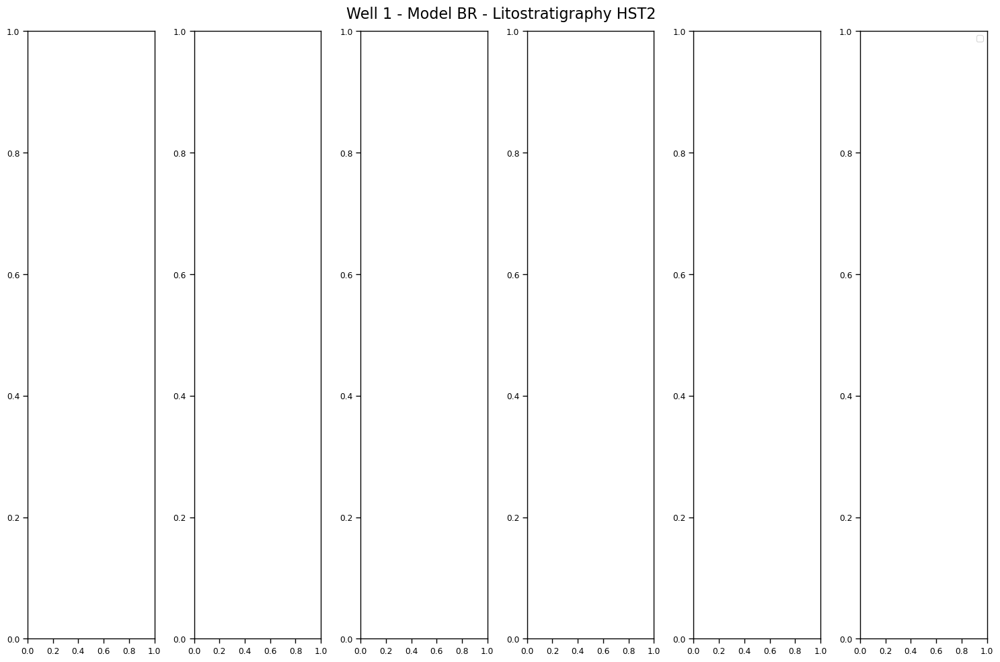

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


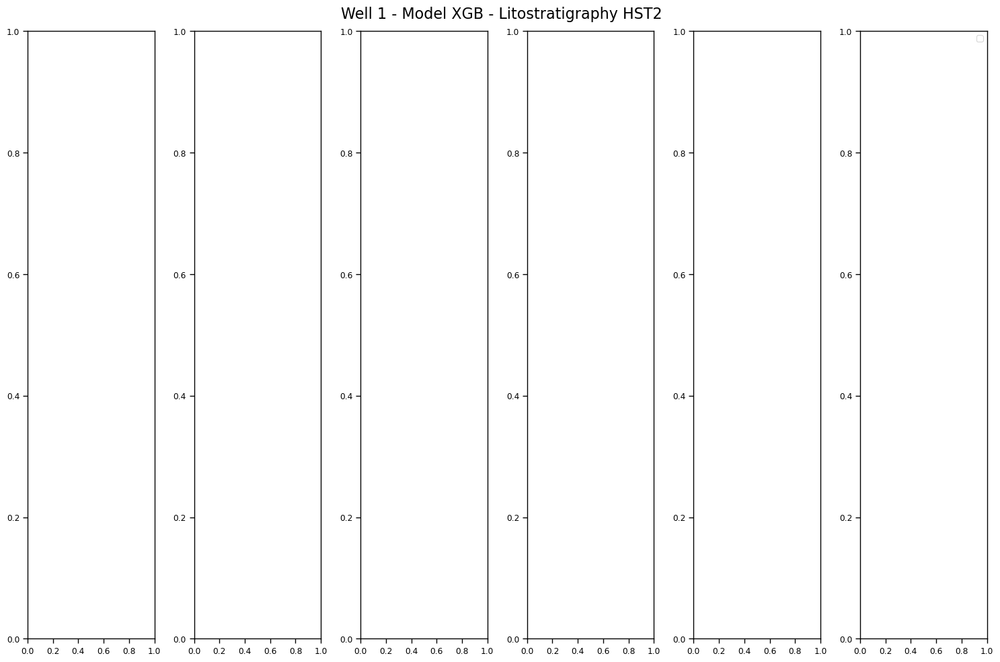

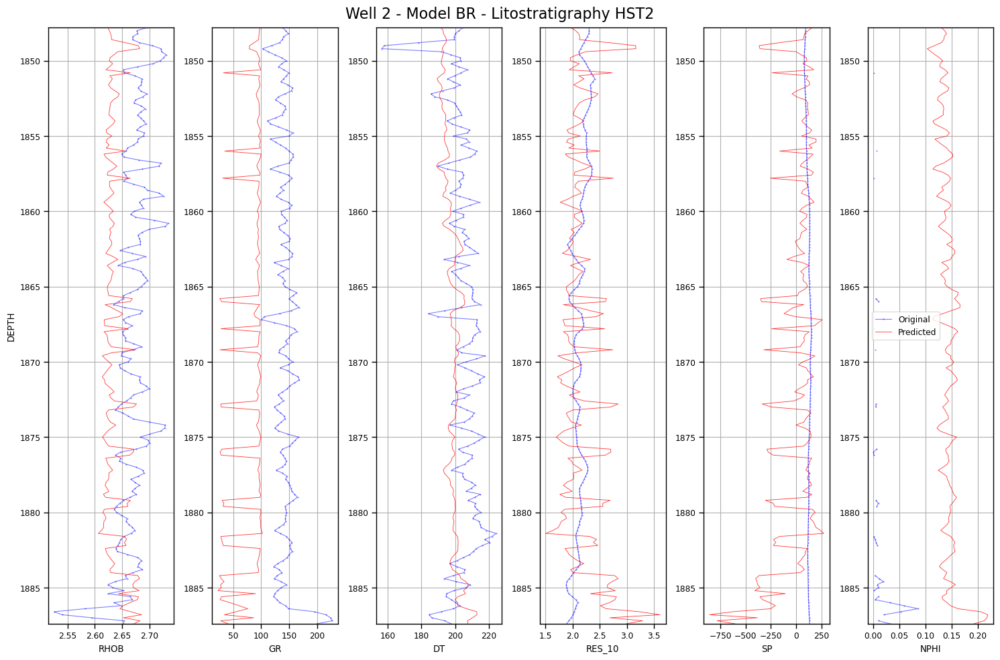

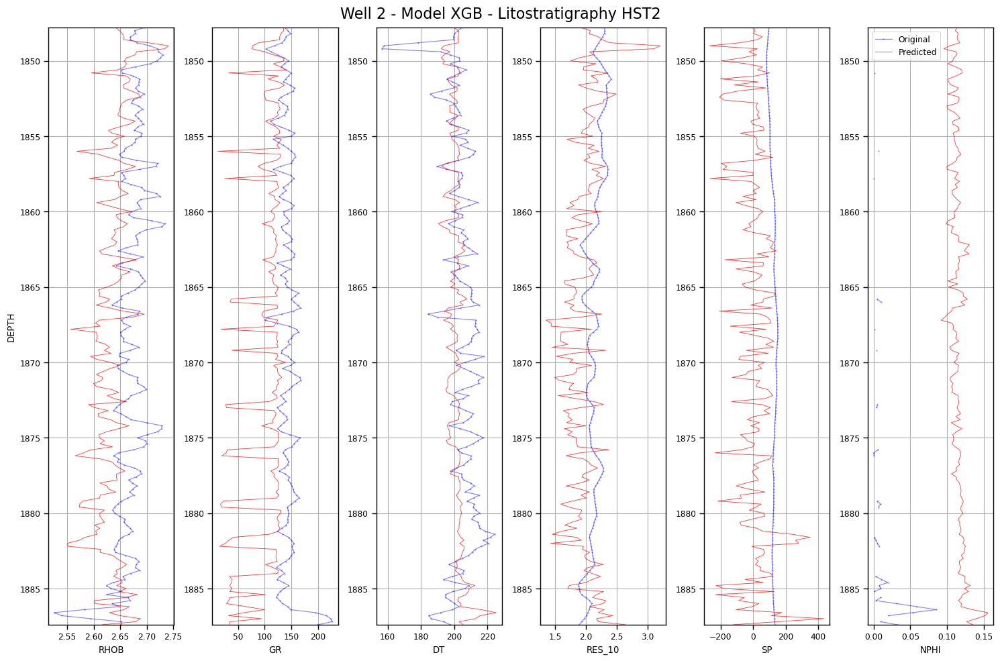

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


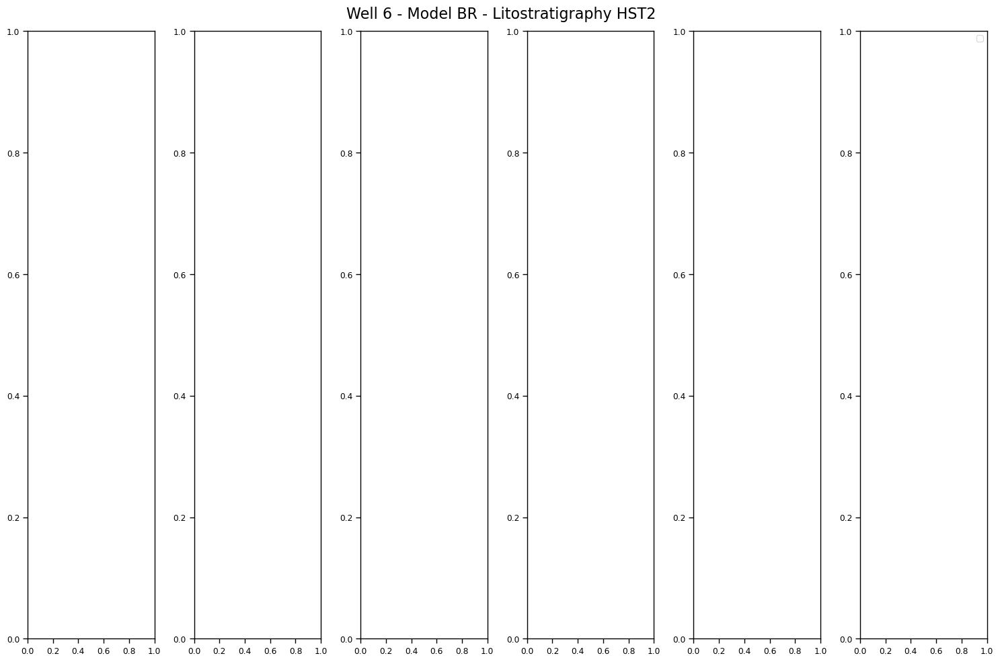

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


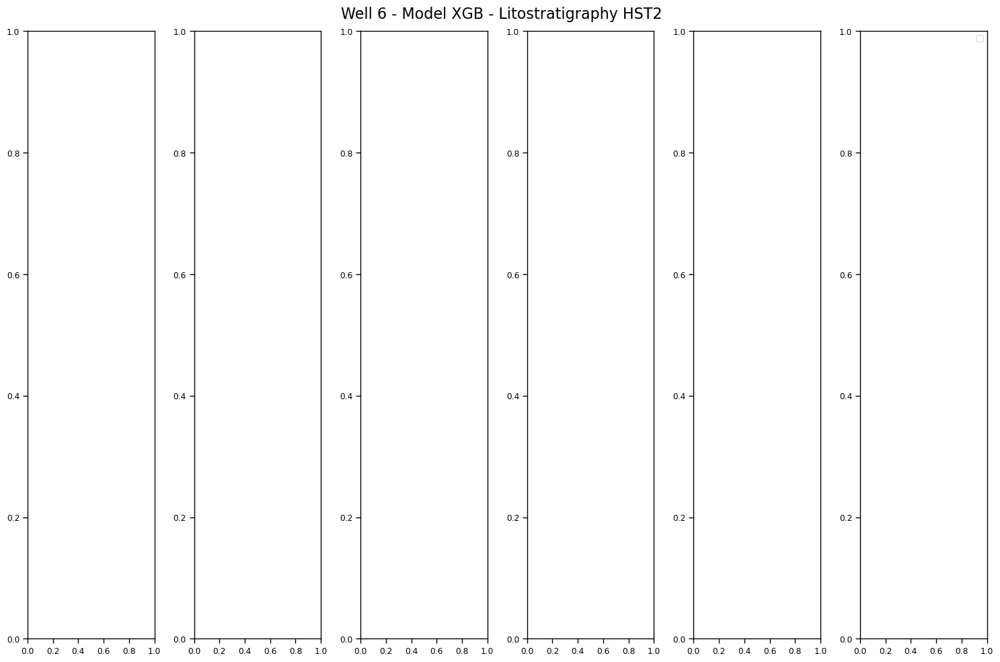

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


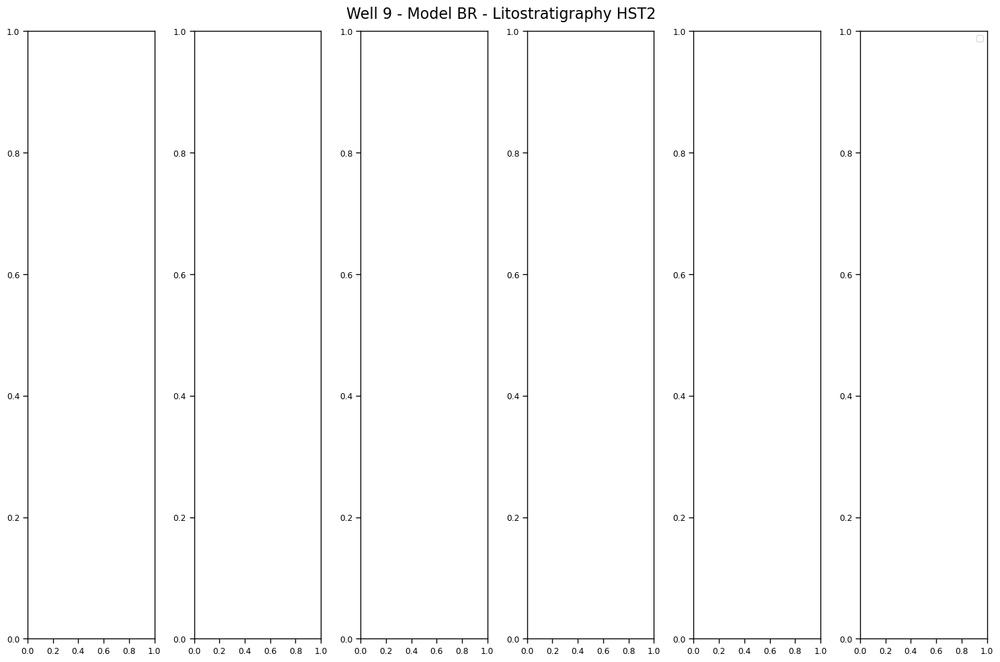

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


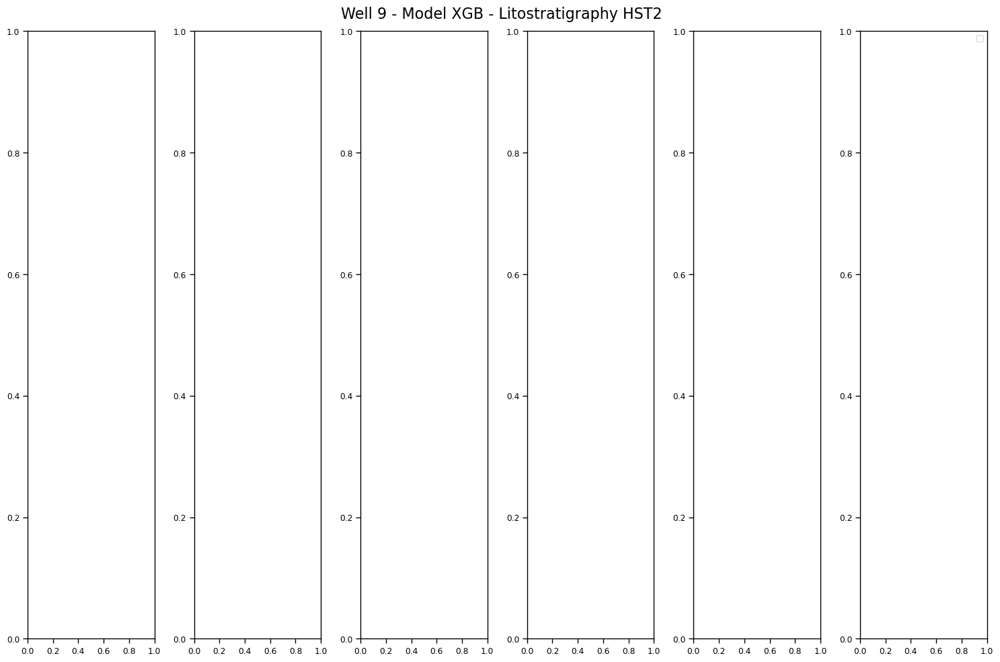

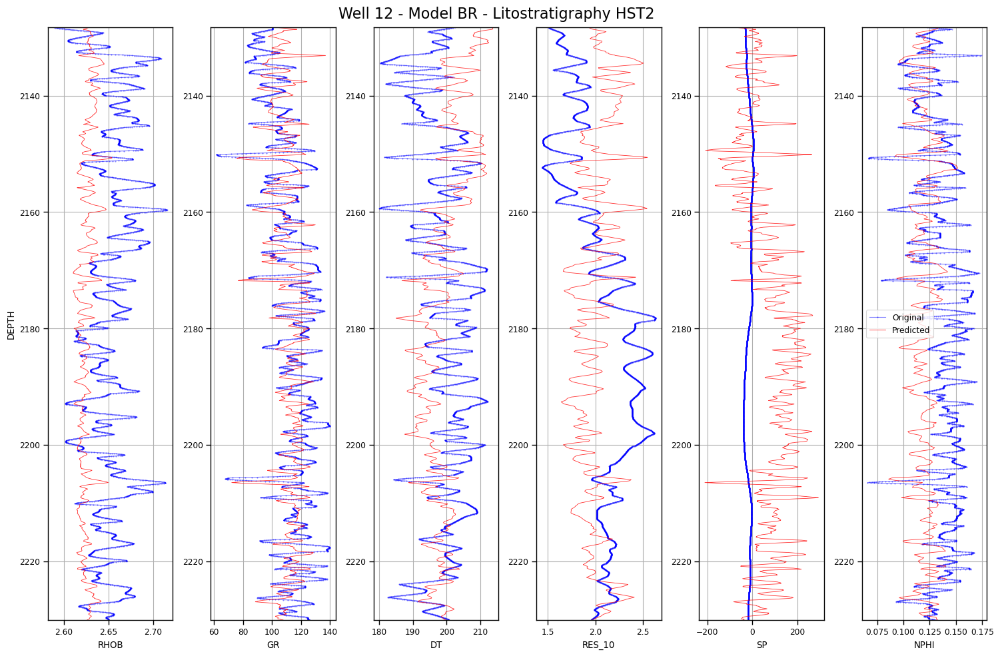

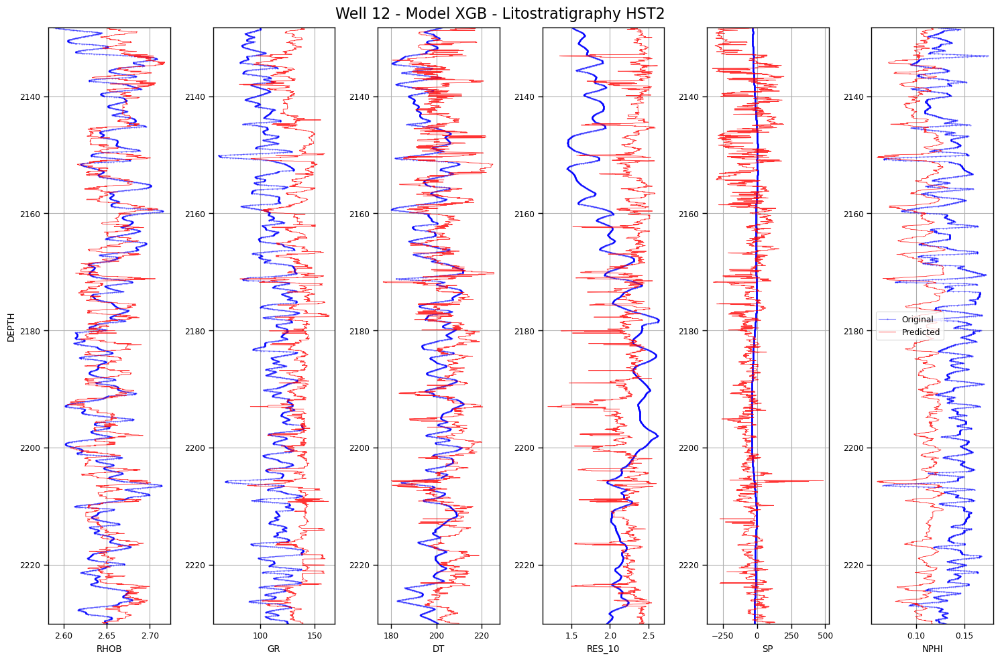

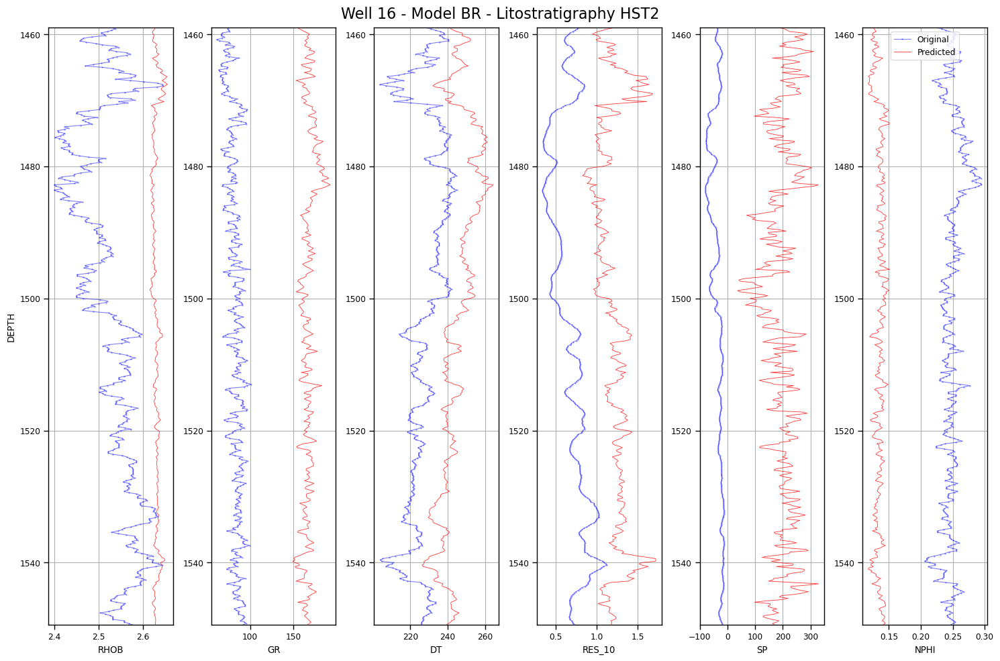

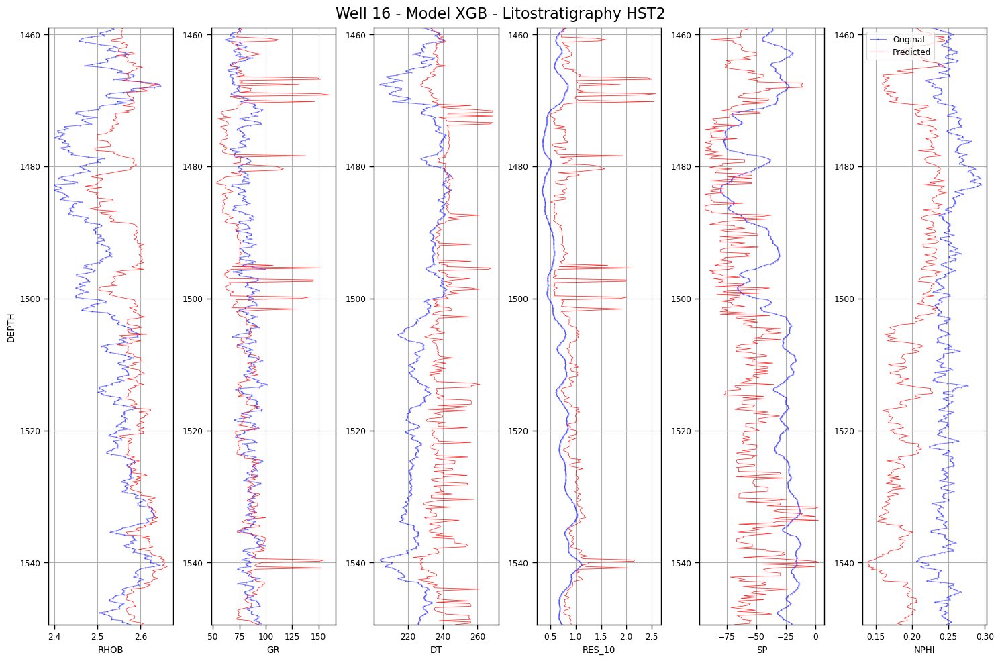

In [61]:
well_logs = ['RHOB', 'GR', 'DT', 'RES_10', 'SP', 'NPHI']

models = ['BR', 'XGB']

strats = ['HST2']

# test_wells_plot = [2, 6, 12, 16]
test_wells_plot = test_df['WELL'].unique()

for well in test_wells_plot:
    for model in models:
        for strati in strats:
            results_wells_strat(df=test_df, features=well_logs, name_well=well, model=model, lito_strat=strati) 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


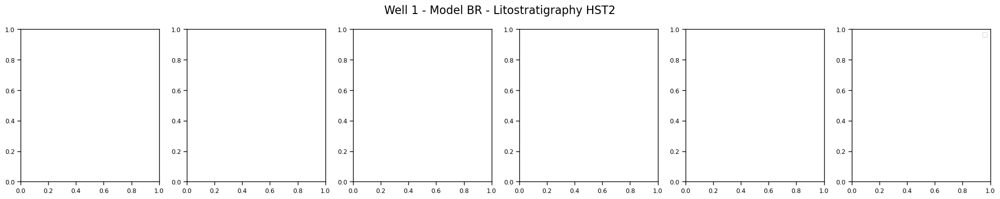

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


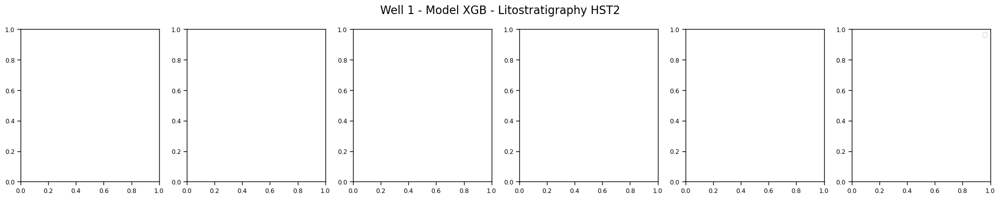

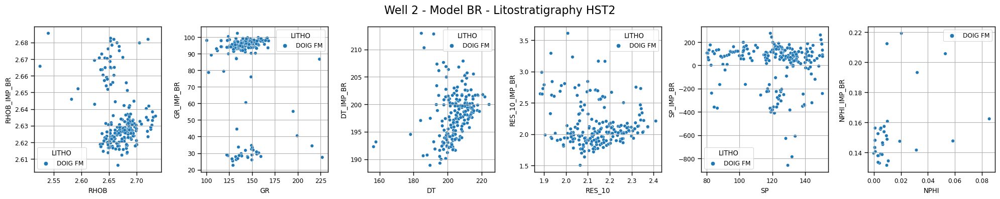

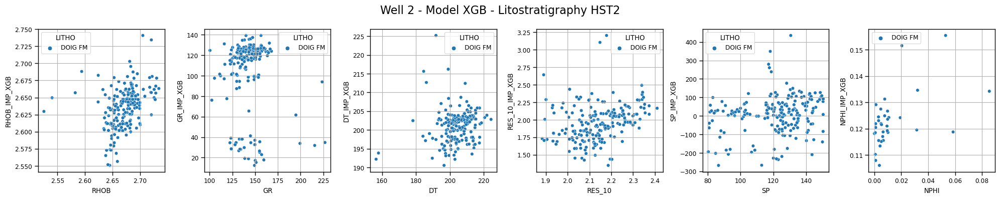

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


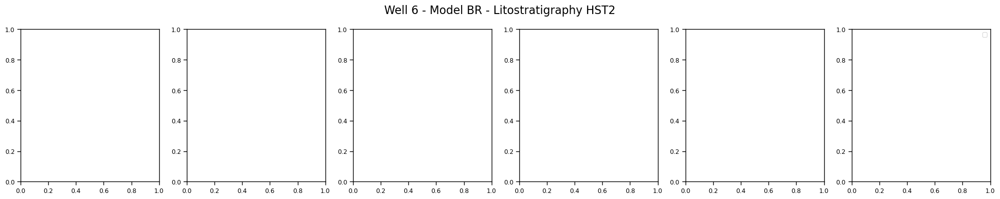

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


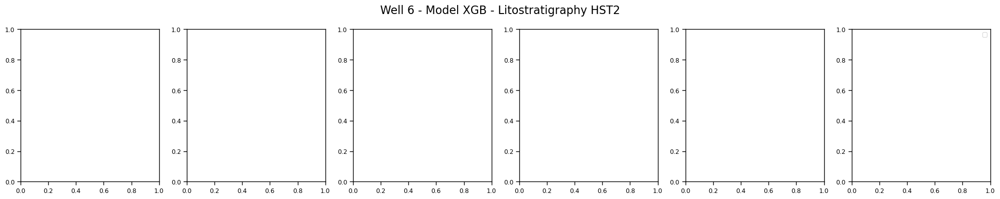

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


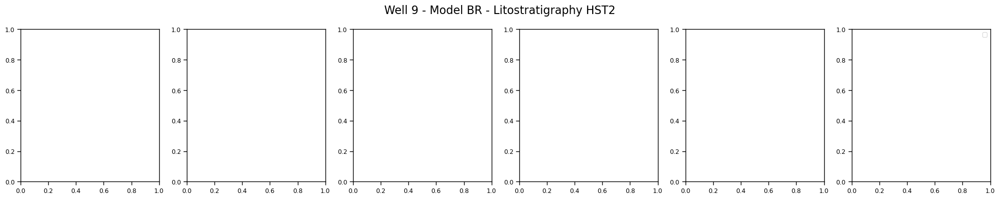

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


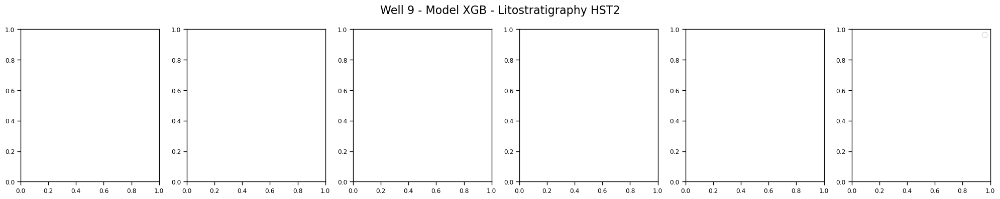

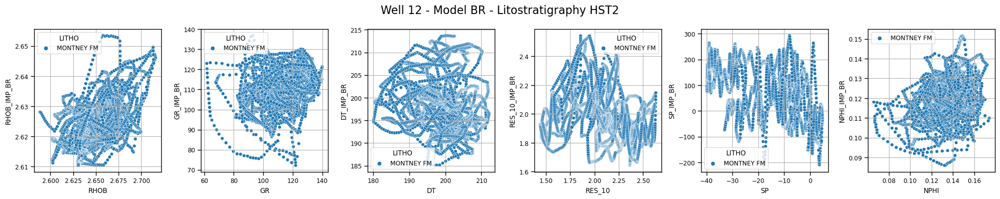

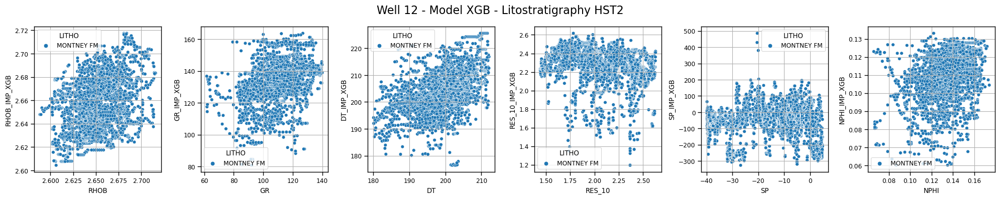

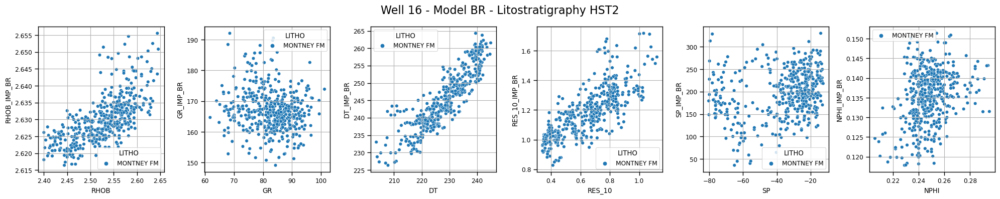

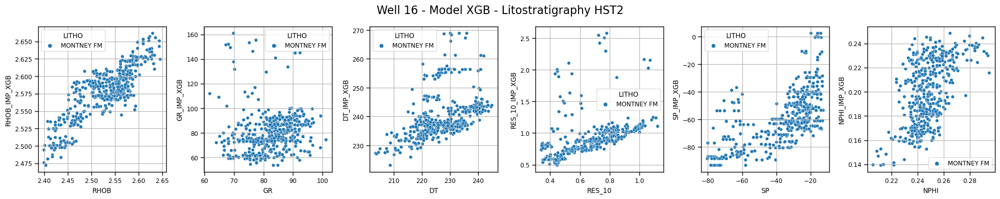

In [62]:
well_logs = ['RHOB', 'GR', 'DT', 'RES_10', 'SP', 'NPHI']

models = ['BR', 'XGB']

strats = ['HST2']

# test_wells_plot = [2, 6, 12, 16]
test_wells_plot = test_df['WELL'].unique()


for well in test_wells_plot:
    for model in models:
        for strati in strats:
            results_wells_strat_scatter(df=test_df, features=well_logs, name_well=well, model=model, lito_strat=strati) 